# ------------------------------ HOME EQUITY LOAN DATASET -----------------------------------

#### Context:
The consumer credit department of a bank wants to automate the decisionmaking process for approval of home equity lines of credit. To do this, they will follow the recommendations of the Equal Credit Opportunity Act to create an empirically derived and statistically sound credit scoring model. The model will be based on data collected from recent applicants granted credit through the current process of loan underwriting. The model will be built from predictive modeling tools, but the created model must be sufficiently interpretable to provide a reason for any adverse actions (rejections).

#### Content: 
The Home Equity dataset (HMEQ) contains baseline and loan performance information for 5,960 recent home equity loans. The target (BAD) is a binary variable indicating whether an applicant eventually defaulted or was seriously delinquent. This adverse outcome occurred in 1,189 cases (20%). For each applicant, 12 input variables were recorded.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

data =  pd.read_csv('hmeq.csv')

## 1. [BASIC INFORMATION]

In [2]:
data.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0,NaN
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0,NaN
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0,NaN
3,1,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0,NaN


- BAD (Bi): 1 = loan defaulted, 0 = loan repaid
- LOAN (Cont): amount of the loan request
- MORTDUE (Cont): amount due on existing mortgage
- VALUE (Cont): value of current property
- REASON (Cat): DebtCon = debt consolidation, HomeImp = home improvement
- JOB (Cat): six occupational categories
- YOJ (Cont): years at present job
- DEROG (Cont): number of major derogatory reports
- DELINQ (Cont): number of delinquent credit lines
- CLAGE (Cont): age of oldest trade line in months
- NINQ (Cont): number of recent credit lines
- CLNO (Cont): number of credit lines
- DEBTINC (Cont): Debt-to-income ratio

In [ ]:
use loandefault;

select REASON, avg(LOAN) as averageLoan from hmeq group by REASON having avg(LOAN) < 1000 order by avg(LOAN) desc;

## 2. [NULL VALUES ANALYSIS]

In [3]:
# data overview (especially on nan & nan percentage)
listItem = []
for col in data.columns :
    listItem.append([col, data[col].dtype, data[col].isna().sum(), round((data[col].isna().sum()/len(data[col])) * 100,2),
                    data[col].nunique(), list(data[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['Data Features', 'Data Type', 'Null Count', 'Null %', 'N-Unique', 'Unique Sample'],
                     data=listItem)
dfDesc

,Data Features,Data Type,Null Count,Null %,N-Unique,Unique Sample
0,BAD,int64,0,0.00,2,"[1, 0]"
1,LOAN,int64,0,0.00,540,"[15500, 2000]"
2,MORTDUE,float64,518,8.69,5053,"[78741.0, 73505.0]"
3,VALUE,float64,112,1.88,5381,"[153552.0, 34704.0]"
4,REASON,object,252,4.23,2,"[nan, HomeImp]"
5,JOB,object,279,4.68,6,"[Office, Sales]"
6,YOJ,float64,515,8.64,99,"[13.0, 9.5]"
7,DEROG,float64,708,11.88,11,"[3.0, 6.0]"
8,DELINQ,float64,580,9.73,14,"[10.0, 12.0]"
9,CLAGE,float64,308,5.17,5314,"[119.60347765, 223.76961057]"


In [4]:
## rows with nulls
len(data[data.isnull().any(axis=1)])

2596

In [5]:
## rows without nulls
len(data[~data.isnull().any(axis=1)])

3364

In [6]:
## the dataset with nulls
data[data.isnull().any(axis=1)]

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0,NaN
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0,NaN
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0,NaN
3,1,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5944,0,81400,22344.0,108280.0,HomeImp,NaN,25.0,0.0,0.0,148.114994,0.0,14.0,34.285741
5945,0,81400,21041.0,111304.0,HomeImp,NaN,26.0,0.0,0.0,146.322783,0.0,14.0,32.131373
5946,0,82200,16097.0,111287.0,HomeImp,NaN,26.0,0.0,0.0,142.119979,0.0,14.0,31.743472
5947,0,82200,23197.0,110481.0,HomeImp,NaN,26.0,0.0,1.0,127.767588,0.0,14.0,30.942695


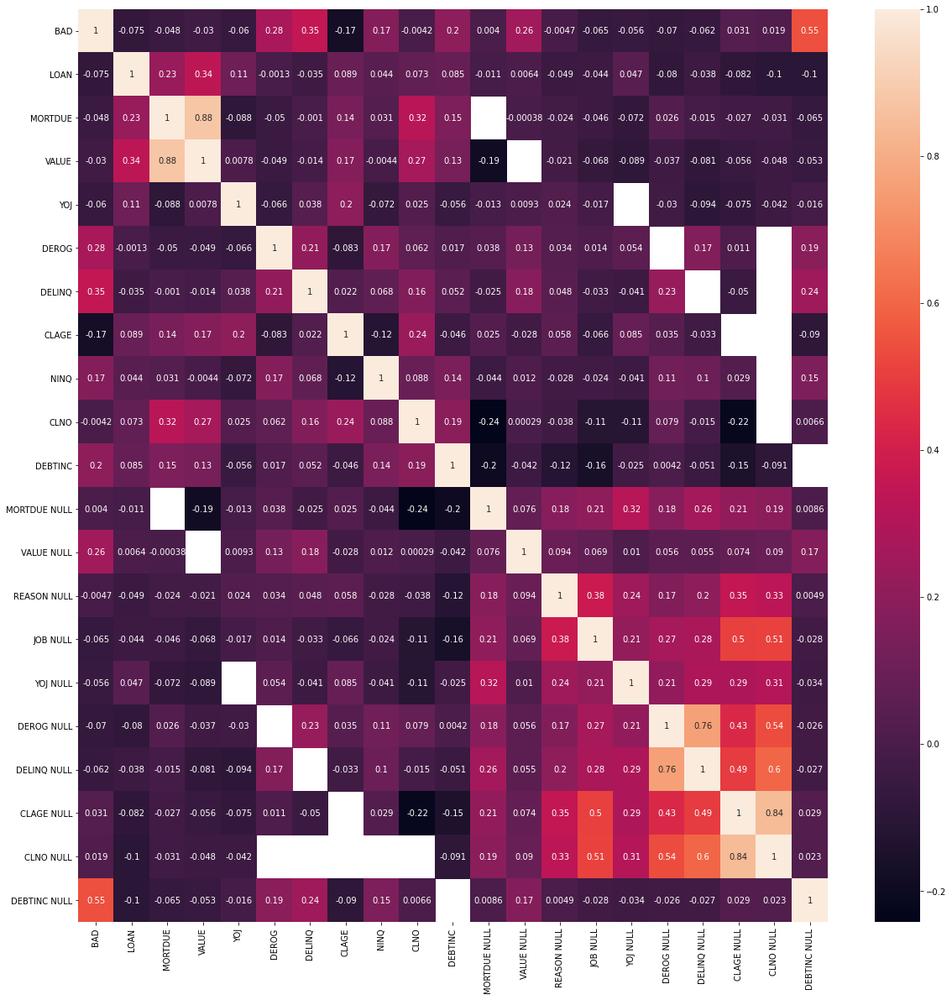

In [4]:
## correlate null features

coba = data.copy()
coba['MORTDUE NULL'] = coba['MORTDUE'].isna()
coba['VALUE NULL'] = coba['VALUE'].isna()
coba['REASON NULL'] = coba['REASON'].isna()
coba['JOB NULL'] = coba['JOB'].isna()
coba['YOJ NULL'] = coba['YOJ'].isna()
coba['DEROG NULL'] = coba['DEROG'].isna()
coba['DELINQ NULL'] = coba['DELINQ'].isna()
coba['CLAGE NULL'] = coba['CLAGE'].isna()
coba['CLNO NULL'] = coba['CLNO'].isna()
coba['DEBTINC NULL'] = coba['DEBTINC'].isna()

plt.figure(figsize= (20,20))
sns.heatmap(coba.corr('pearson'), annot= True)

In [7]:
# trying to find the null combinations
pd.options.display.max_rows = None

null = []
for idx in range(len(data)):
    temp = []
    for i in data.columns:
        if (str(data[i].iloc[idx]).lower() == 'nan'):
            temp.append(i)
            
        else:
            pass
    temp.sort()
    null.append(temp)
        
print(len(null))

(pd.Series(null)).value_counts()

5960


[]                                                                               3364
[DEBTINC]                                                                         883
[YOJ]                                                                             184
[MORTDUE]                                                                         166
[DEROG]                                                                           125
[DELINQ, DEROG]                                                                    91
[DELINQ, DEROG, NINQ]                                                              87
[JOB]                                                                              81
[REASON]                                                                           70
[DEBTINC, MORTDUE]                                                                 52
[DEBTINC, VALUE]                                                                   47
[MORTDUE, YOJ]                                        

From the observations:
- It turns out that DEBTINC & DEROG columns has more than 10% nan values, where DEBTINC columns even has at least 20% nan value
- DEROG columns' information may be similar in essence with DELINQ columns' information, thereby safe to be dropped (since it also has a lot of nan values)
- The nan rows & columns appears to be at Random, thereby creating noise. To avoid bias (by imputing nan values), we could drop the rest of nan values

In [2]:
# creating data contingency
mydata = data.copy(deep=True)

# drop debtinc & derog columns because > 10% nan
mydata = mydata.drop(['DEBTINC','DEROG'], axis = 1)

# drop nan rows to eliminate noise
mydata = mydata.dropna() 

# resetting index after dropna
mydata = mydata.reset_index(drop=True)

# final data shape
mydata.shape

(4399, 11)

In [8]:
# saving mydata (clean data) to csv for further usage
mydata.to_csv('mydata.csv', index= False)

In [9]:
# final nan values checking
mydata.isnull().sum()

BAD        0
LOAN       0
MORTDUE    0
VALUE      0
REASON     0
JOB        0
YOJ        0
DELINQ     0
CLAGE      0
NINQ       0
CLNO       0
dtype: int64

## 3. [EXPLORATORY DATA ANALYSIS]

<Figure size 2880x2160 with 0 Axes>

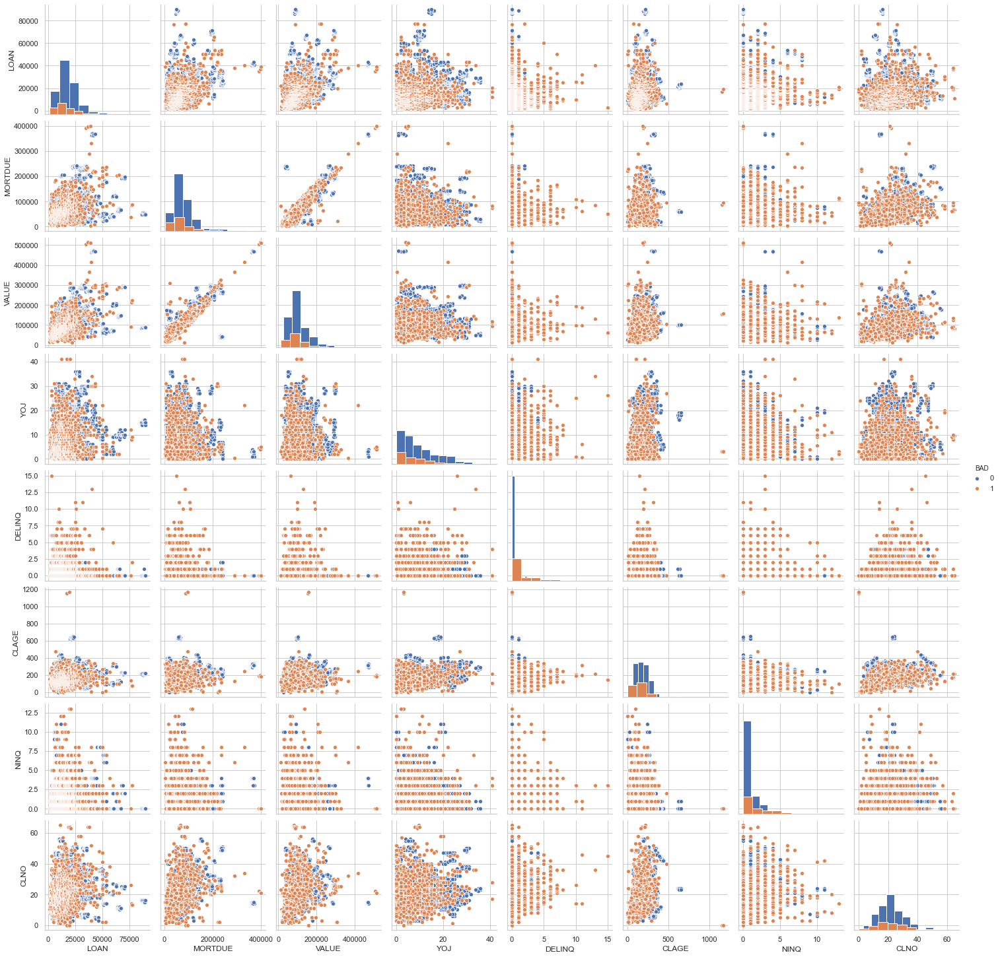

In [88]:
# creating a pairplot with my target variable as the hue
plt.figure(figsize=(40,30))
sns.pairplot(mydata, hue = 'BAD', diag_kind = 'hist')

In [11]:
# groupby BAD description for numerical features
mydata.groupby(['BAD']).describe().T

BAD                        0              1
LOAN    count    3541.000000     858.000000
        mean    18947.274781   16486.363636
        std     10795.069577   10952.876172
        min      1700.000000    1100.000000
        25%     11900.000000    9025.000000
        50%     16700.000000   14650.000000
        75%     23600.000000   20750.000000
        max     89900.000000   77400.000000
MORTDUE count    3541.000000     858.000000
        mean    75950.583739   69052.700758
        std     44159.080267   47172.159731
        min      2619.000000    2800.000000
        25%     49100.000000   40000.000000
        50%     67144.000000   60077.000000
        75%     93040.000000   84885.750000
        max    371003.000000  399412.000000
VALUE   count    3541.000000     858.000000
        mean   107353.128887   98125.961317
        std     53324.096030   59784.354928
        min     26000.000000   12500.000000
        25%     71412.000000   61000.000000
        50%     94898.000000   83839.000000
        75%    122335.000000  118093.750000
        max    471827.000000  512650.000000
YOJ     count    3541.000000     858.000000
        mean        9.376532       7.994056
        std         7.688366       6.999290
        min         0.000000       0.000000
        25%         3.000000       2.925000
        50%         8.000000       6.000000
        75%        14.000000      12.000000
        max        36.000000      41.000000
DELINQ  count    3541.000000     858.000000
        mean        0.255860       1.200466
        std         0.663451       1.933407
        min         0.000000       0.000000
        25%         0.000000       0.000000
        50%         0.000000       0.000000
        75%         0.000000       2.000000
        max         4.000000      15.000000
CLAGE   count    3541.000000     858.000000
        mean      184.769641     150.093976
        std        80.531878      88.330673
        min         0.486711       0.000000
        25%       122.244945      94.903927
        50%       181.027275     132.013468
        75%       234.658545     194.658738
        max       649.747104    1168.233561
NINQ    count    3541.000000     858.000000
        mean        1.037560       1.847319
        std         1.491407       2.205594
        min         0.000000       0.000000
        25%         0.000000       0.000000
        50%         1.000000       1.000000
        75%         2.000000       3.000000
        max        11.000000      13.000000
CLNO    count    3541.000000     858.000000
        mean       22.254448      22.202797
        std         9.185529      11.278417
        min         3.000000       0.000000
        25%        16.000000      14.000000
        50%        21.000000      21.000000
        75%        27.000000      28.000000
        max        56.000000      65.000000

In [14]:
# whole data description for numerical features
mydata.describe().T

,count,mean,std,min,25%,50%,75%,max
BAD,4399.0,0.195044,0.396280,0.0,0.000000,0.000000,0.000000,1.000000
LOAN,4399.0,18467.288020,10868.616375,1100.0,11250.000000,16200.000000,23200.000000,89900.000000
MORTDUE,4399.0,74605.190787,44840.567654,2619.0,47844.000000,65372.000000,91178.500000,399412.000000
VALUE,4399.0,105553.422187,54759.200599,12500.0,69762.500000,92961.000000,121853.000000,512650.000000
YOJ,4399.0,9.106888,7.577961,0.0,3.000000,7.000000,13.000000,41.000000
DELINQ,4399.0,0.440100,1.105812,0.0,0.000000,0.000000,0.000000,15.000000
CLAGE,4399.0,178.006349,83.242710,0.0,116.779935,172.767888,227.607781,1168.233561
NINQ,4399.0,1.195499,1.685604,0.0,0.000000,1.000000,2.000000,13.000000
CLNO,4399.0,22.244374,9.628128,0.0,16.000000,21.000000,27.000000,65.000000


From the observations:
- It is quite interesting to note that, in all of the features, the group means for 0 category (loan repaid) is higher than the 1 category (loan defaulted) except for the DELINQ & NINQ features.
- DELINQ stands for the amount of delinquent credit lines. In this groupby analysis, we can see that the 0 & 1 category has a group mean of 0,26 & 1,20 respectively. Furthermore, the mean of 1,20 is even higher than the mean of the whole which is 0,44. It means that the 1 category is more likely to have more delinquent credit lines.
- NINQ stands for the amount of recent credit lines. In this groupby analysis, we can see that the 0 & 1 category has a group mean of 1,04 & 1,85 respectively. Furthermore, the mean of 1,85 is even higher than the mean of the whole which is 1,20. It means that the 1 category is more likely to have a slightly more number of recent credit lines.
- It is interesting what these two features may bring, so let's keep these two in mind for the next steps.

In [11]:
# groupby description for categorical values
mydata.groupby(['BAD']).describe(exclude = 'number').T

BAD                  0        1
REASON count      3541      858
       unique        2        2
       top     DebtCon  DebtCon
       freq       2515      588
JOB    count      3541      858
       unique        6        6
       top       Other    Other
       freq       1323      386

In [15]:
# whole data description for categorical values
mydata.describe(exclude='number').T

,count,unique,top,freq
REASON,4399,2,DebtCon,3103
JOB,4399,6,Other,1709


- It could be said that there's a significant amount that shows the reason for equity loan (REASON) is "Debt Consolidation" & their job category (JOB) is "Other".
- I'm interested with this many JOB categories, let's find out more about it.

In [91]:
# grouped by JOB description
pd.options.display.max_rows = 72
mydata.groupby(['JOB']).describe().T

JOB                      Mgr         Office          Other        ProfExe  \
BAD     count     611.000000     731.000000    1709.000000    1131.000000   
        mean        0.219313       0.135431       0.225863       0.148541   
        std         0.414120       0.342418       0.418272       0.355793   
        min         0.000000       0.000000       0.000000       0.000000   
        25%         0.000000       0.000000       0.000000       0.000000   
        50%         0.000000       0.000000       0.000000       0.000000   
        75%         0.000000       0.000000       0.000000       0.000000   
        max         1.000000       1.000000       1.000000       1.000000   
LOAN    count     611.000000     731.000000    1709.000000    1131.000000   
        mean    19096.563011   17275.376197   17491.047396   19115.473033   
        std      9020.154372   10256.439125   11033.155616    9789.645931   
        min      2200.000000    1700.000000    1100.000000    2500.000000   
        25%     11950.000000   10650.000000   10500.000000   12400.000000   
        50%     18300.000000   15500.000000   15000.000000   17100.000000   
        75%     24550.000000   20800.000000   22400.000000   23600.000000   
        max     53600.000000   67400.000000   89900.000000   65500.000000   
MORTDUE count     611.000000     731.000000    1709.000000    1131.000000   
        mean    80199.516628   68428.268851   59706.089947   94003.791653   
        std     43820.849819   29024.095102   32717.717352   55695.585791   
        min      8795.000000   10171.000000    2800.000000    3372.000000   
        25%     51411.000000   50824.000000   39893.000000   58793.500000   
        50%     75110.000000   63589.000000   55000.000000   82000.000000   
        75%     96944.000000   82699.000000   74459.000000  119875.000000   
        max    241931.000000  173975.000000  207687.000000  399412.000000   
VALUE   count     611.000000     731.000000    1709.000000    1131.000000   
        mean   106106.699280   97261.419986   87360.415992  131904.430592   
        std     47720.252914   36675.944847   40832.006384   68541.137355   
        min     27750.000000   21500.000000   16020.000000   12500.000000   
        25%     72890.500000   70531.500000   62000.000000   87674.500000   
        50%     97700.000000   92000.000000   80300.000000  110431.000000   
        75%    132246.500000  115825.000000  101208.000000  163132.500000   
        max    299772.000000  244322.000000  301984.000000  512650.000000   
YOJ     count     611.000000     731.000000    1709.000000    1131.000000   
        mean        9.749264       8.704583       9.453745       8.913439   
        std         7.294054       8.315154       8.175084       6.421613   
        min         0.000000       0.000000       0.000000       0.000000   
        25%         4.000000       2.000000       3.000000       4.000000   
        50%         9.000000       6.000000       7.000000       8.000000   
        75%        14.000000      12.500000      15.000000      13.000000   
        max        41.000000      41.000000      36.000000      31.000000   
DELINQ  count     611.000000     731.000000    1709.000000    1131.000000   
        mean        0.535188       0.504788       0.425395       0.363395   
        std         1.167871       1.146008       1.067329       1.014778   
        min         0.000000       0.000000       0.000000       0.000000   
        25%         0.000000       0.000000       0.000000       0.000000   
        50%         0.000000       0.000000       0.000000       0.000000   
        75%         1.000000       1.000000       0.000000       0.000000   
        max        11.000000      13.000000      11.000000       8.000000   
CLAGE   count     611.000000     731.000000    1709.000000    1131.000000   
        mean      173.231675     175.642458     165.828052     197.694764   
        std        78.940250      71.093083      83.553506      89.805528

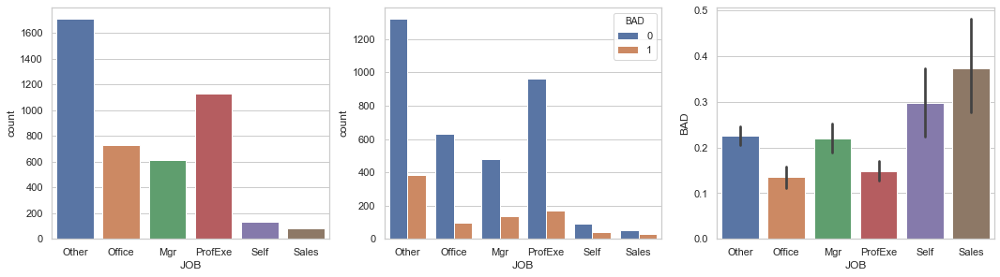

In [96]:
# on JOB-BAD
sns.set_style("whitegrid")
plt.figure(figsize= (18,10))
plt.subplot(2,3,1)
sns.countplot(data = mydata, x='JOB')
plt.subplot(2,3,2)
sns.countplot(data = mydata, x='JOB' , hue = 'BAD')
plt.subplot(2,3,3)
sns.barplot(data = mydata, x='JOB', y='BAD')

- It appears that "Other" is the highest in terms of frequency. Accordingly, the amount of loan default (BAD = 1) reaches the highest frequency in this "Other" category. Nevertheless, the highest group mean towards loan default is the "Self" category (mean = 0.37). Perhaps, it is due to its sample size which is the smallest amongst all that could help it in reaching the highest means. 

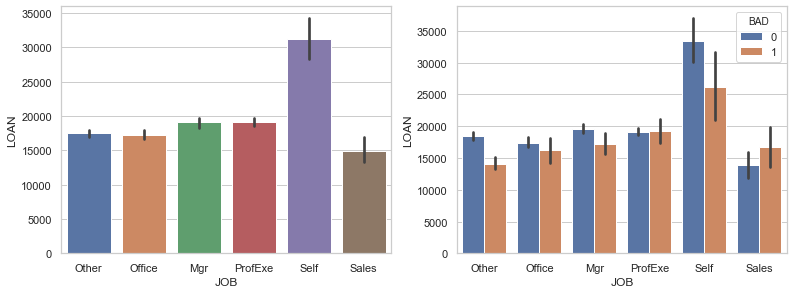

In [82]:
# on JOB-LOAN-BAD
plt.figure(figsize= (13,10))
plt.subplot(2,2,1)
sns.barplot(data = mydata, x='JOB', y= 'LOAN')
plt.subplot(2,2,2)
sns.barplot(data = mydata, x='JOB', y= 'LOAN' , hue = 'BAD')

- In terms of LOAN, it appears that the "Self" category takes the first prize. It reaches the mean value of USD31.264, perhaps, due to its sample size which is the second smallest. If we take a look in terms of LOAN max value, it is taken by  the "Other" category with the LOAN value of USD89.900. But then it's interesting to note that SELF, with its highest LOAN mean, has also the highest LOAN mean that defaults.

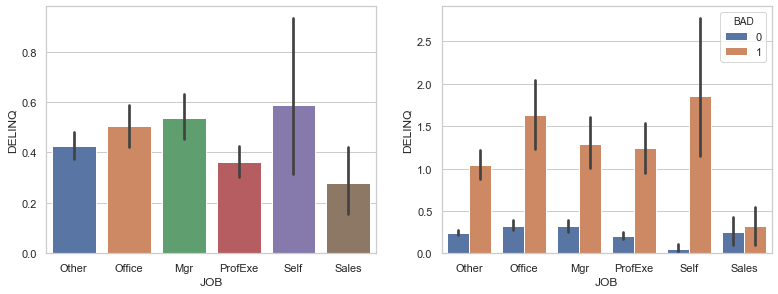

In [79]:
# on JOB-DELINQ-BAD
plt.figure(figsize= (13,10))
plt.subplot(2,2,1)
sns.barplot(data = mydata, x='JOB', y= 'DELINQ' )
plt.subplot(2,2,2)
sns.barplot(data = mydata, x='JOB', y= 'DELINQ' , hue = 'BAD')

- In terms of DELINQ, it appears that the "Self" category takes the first prize again. It reaches the DELINQ mean value of 0.589 credit lines. Moreover, it also has the highest DELINQ max value, with the value of 15 credit lines. It's interesting to see that this "Self" category has the lowest DELINQ mean that repays, and at the same time, has the highest DELINQ mean that defaults

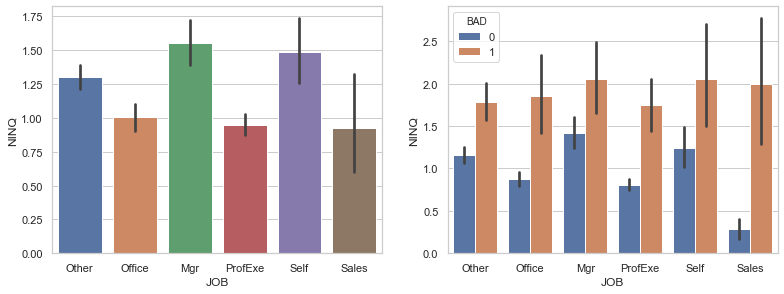

In [80]:
# on JOB-NINQ-BAD
plt.figure(figsize= (13,10))
plt.subplot(2,2,1)
sns.barplot(data = mydata, x='JOB', y= 'NINQ')
plt.subplot(2,2,2)
sns.barplot(data = mydata, x='JOB', y= 'NINQ' , hue = 'BAD')

- In terms of NINQ, it appears that the "Mgr" category takes the first prize. It reaches the NINQ mean value of 1.55 recent credit lines. Special note on the "Self" Category that reachest the second highest NINQ mean of 1.48 recent credit lines. Nevertheless, the highest NINQ max value is taken by the "Office" Category with the value of 13 recent credit lines. In terms of loan defaults, the NINQ mean of each JOB categories does not differ a lot. On the other hand, for loan repayments, the NINQ mean of "Sales" category seems very distinctly the lowest.

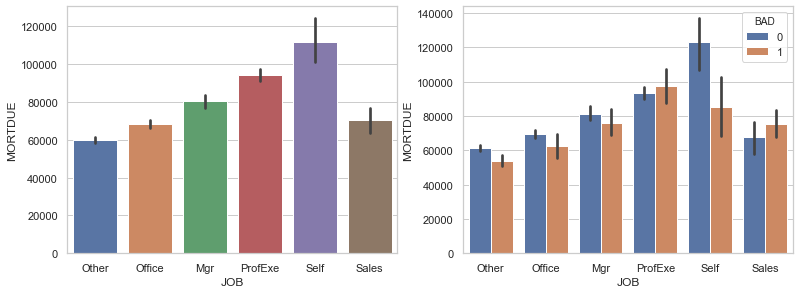

In [83]:
# on JOB-MORTDUE-BAD
plt.figure(figsize= (13,10))
plt.subplot(2,2,1)
sns.barplot(data = mydata, x='JOB', y= 'MORTDUE')
plt.subplot(2,2,2)
sns.barplot(data = mydata, x='JOB', y= 'MORTDUE' , hue = 'BAD')

- In terms of MORTDUE, it appears that the "Self" category, again, takes the first prize. It reaches the MORTDUE mean value of USD111.610. Nevertheless, the highest MORTDUE max value is taken by the "ProfExe" category with the value of USD399.412. Moreover, in terms of loan defaults, the MORTDUE mean of "ProfExe" category is also the highest one. Special note on the MORTDUE mean in "Self" category that repays for it reaches the highest MORTDUE means.

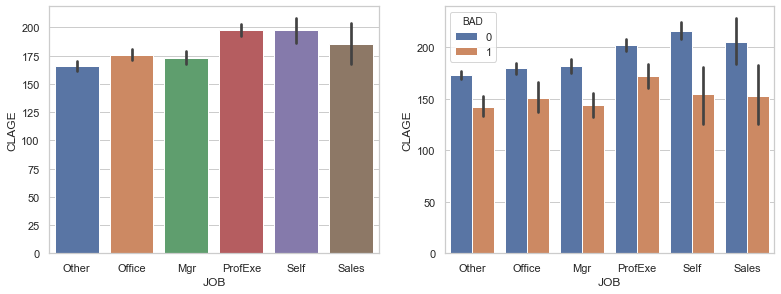

In [84]:
# on JOB-CLAGE-BAD
plt.figure(figsize= (13,10))
plt.subplot(2,2,1)
sns.barplot(data = mydata, x='JOB', y= 'CLAGE')
plt.subplot(2,2,2)
sns.barplot(data = mydata, x='JOB', y= 'CLAGE' , hue = 'BAD')

- In terms of CLAGE, it appears that the "ProfExe" & "Self" category takes the first prize & second prize with close differences. It reaches the CLAGE mean value of 197.6 months & 197.2 months, respectively. Nevertheless, the highest MORTDUE max value is taken by the "Other" category with the value of 1168 months. In terms of loan defaults, the CLAGE mean of JOB categories appears to not differ a lot. Special note on the CLAGE mean in "Self" category that repays for it reaches the highest CLAGE means.

## 3.1 [CRAMER'S V ]

In [16]:
# defining cramers v function to see the association between two categorical features
def cramers_v(x,y):
    import scipy.stats as ss
    confusion_matrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r -((r-1)**2)/(n-1)
    kcorr = k -((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

In [16]:
# cramers v value between REASON & BAD
cramers_v(mydata['REASON'], mydata['BAD'])

0.014682655435199449

In [17]:
# cramers v value between JOB & BAD
cramers_v(mydata['JOB'], mydata['BAD'])

0.12224706330683507

In terms of Cramer's V:
- There seems to be no or very weak association between REASON (reason for loan) & BAD (repaid or default)
- There seems to be a moderate association between JOB (job category) & BAD

## 3.2 [CORRELATION RATIO]

In [25]:
# defining correlation ratio function to see the association between numerical-categorical features
def correlation_ratio(categories, measurements):
    fcat, _ = pd.factorize(categories)
    cat_num = np.max(fcat) + 1
    y_avg_array = np.zeros(cat_num)
    n_array = np.zeros(cat_num)
    for i in range(0, cat_num):
        cat_measures = measurements[np.argwhere(fcat==i).flatten()]
        n_array[i] = len(cat_measures)
        y_avg_array[i] = np.average(cat_measures)
    y_total_avg = np.sum(np.multiply(y_avg_array, n_array))/np.sum(n_array)
    numerator = np.sum(np.multiply(n_array, np.power(np.subtract(y_avg_array, y_total_avg),2)))
    denominator = np.sum(np.power(np.subtract(measurements, y_total_avg),2))
    if numerator == 0:
        eta = 0.0
    else:
        eta = np.sqrt(numerator/denominator)
    return eta

from scipy.stats import shapiro, anderson, skew, kurtosis
for i in mydata.drop('BAD',axis = 1).select_dtypes(exclude = 'object').columns:
    print(i)
    print('Correlation Ratio: {}'.format(correlation_ratio(mydata['BAD'], mydata[i])))
    if shapiro(mydata[i])[1] < 0.05:
        print('Non-Normal Distribution')
    else:
        print('Normal Distribution')
        
    print('Skewness: {}, Kurtosis {}'.format(skew(mydata[i]), kurtosis(mydata[i])))
    print('\n')

LOAN
Correlation Ratio: 0.08972711146198253
Non-Normal Distribution
Skewness: 2.0835492826981863, Kurtosis 7.566999294658489


MORTDUE
Correlation Ratio: 0.060960249311815685
Non-Normal Distribution
Skewness: 1.9162960160377929, Kurtosis 6.880643474600088


VALUE
Correlation Ratio: 0.06677491164363557
Non-Normal Distribution
Skewness: 2.0163721894057933, Kurtosis 7.167826668196108


YOJ
Correlation Ratio: 0.07229483292135219
Non-Normal Distribution
Skewness: 0.9422528360860315, Kurtosis 0.30884257641239143


DELINQ
Correlation Ratio: 0.3385099288882887
Non-Normal Distribution
Skewness: 4.148849165155931, Kurtosis 25.673921866288406


CLAGE
Correlation Ratio: 0.16507472859026304
Non-Normal Distribution
Skewness: 1.6374129494106777, Kurtosis 11.1920432765754


NINQ
Correlation Ratio: 0.19037167262790405
Non-Normal Distribution
Skewness: 2.4399160402450466, Kurtosis 8.246574762312688


CLNO
Correlation Ratio: 0.0021258681833620993
Non-Normal Distribution
Skewness: 0.7583672349582243, Kurt

In terms of Correlation Ratio:
- There seems to be a moderate association between DELINQ (amount of delinquent credit lines) & BAD (repaid or default)
- There seems to be a moderate association between NINQ (amount of recent credit lines) & BAD
- There seems to be a moderate association between CLAGE (age of oldest credit line in months) & BAD 
- There seems to be a weak or no association between the rest of the features & BAD 

In terms of Shapiro value:
- All the numerical features has a non-normal distribution

## 3.3 [PEARSON CORRELATION]

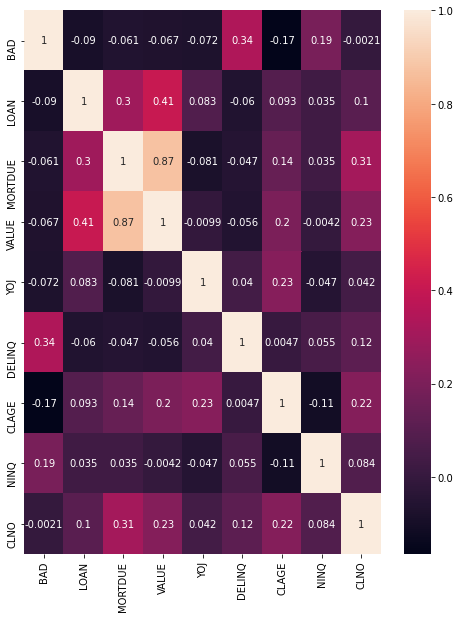

In [19]:
# plotting pearson correlation heatmap
plt.figure(figsize=(8,10))
sns.heatmap(mydata.corr(),annot =True)

In terms of Pearson Correlation:
- There seems to be a moderate (positive) linear relationship between DELINQ (amount of delinquent credit lines) & BAD (repaid or default)
- There seems to be a weak (positive) linear relationship between NINQ (amount of recent credit lines) & BAD
- There seems to be a weak (negative) linear relationship between CLAGE (age of oldest credit line in months) & BAD 
- There seems to be a very weak or linear relationship between the rest of the features & BAD 

## 3.4 [SPEARMAN CORRELATION]

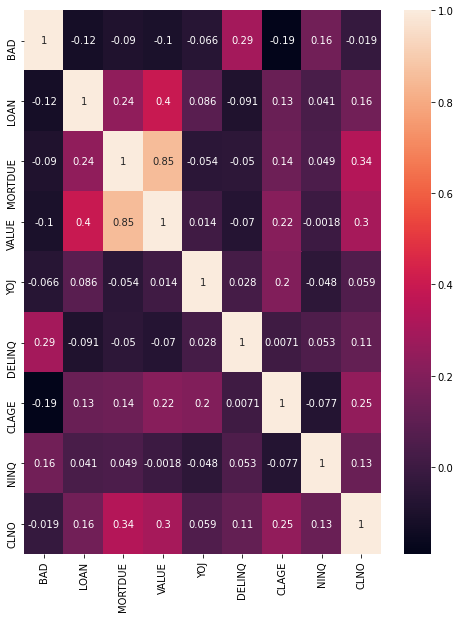

In [20]:
# plotting spearman correlation heatmap
plt.figure(figsize=(8,10))
sns.heatmap(mydata.corr(method = 'spearman'),annot =True)

In terms of Spearman Correlation:
- There seems to be a moderate (positive) monotonic relationship between DELINQ (amount of delinquent credit lines) & BAD (repaid or default)
- There seems to be a weak (positive) monotonic relationship between NINQ (amount of recent credit lines) & BAD
- There seems to be a weak (negative) monotonic relationship between CLAGE (age of oldest credit line in months) & BAD
- There seems to be a weak (negative) monotonic relationship between LOAN (amount of loan requested) & BAD
- There seems to be a weak (negative) monotonic relationship between VALUE (value of the existing property) & BAD
- There seems to be a very weak or no monotonic relationship between the rest of the features & BAD 

## 3.5 [HYPOTHESIS TESTING]

In [18]:
## A/B testing for categorical-categorical columns
from scipy.stats import chi2_contingency
chi2_check = []
categorical_columns = mydata.select_dtypes('object').columns

for i in categorical_columns:
    if chi2_contingency(pd.crosstab(mydata['BAD'], mydata[i]))[1] < 0.05:
        chi2_check.append('Accept H1')
    else:
        chi2_check.append('Accept H0')

chi = pd.DataFrame(data = [categorical_columns, chi2_check]).T 
chi.columns = ['Column', 'Hypothesis']
chi

,Column,Hypothesis
0,REASON,Accept H0
1,JOB,Accept H1


In terms of Chi-Square test:
- since H1 is accepted, there seems to be an influencial relationship between JOB (job category) & BAD (repaid or default)
- since H0 is accepted, there seems to be no influencial relationship between REASON (loan reason) & BAD 

In [19]:
## A/B testing for categories within categorical columns
check = {}
for i in chi[chi['Hypothesis'] == 'Accept H1']['Column']:
    dummies = pd.get_dummies(mydata[i])
    bon_p_value = 0.05/mydata[i].nunique()
    for series in dummies:
        if chi2_contingency(pd.crosstab(mydata['BAD'], dummies[series]))[1] < bon_p_value:
            check['{}_{}'.format(i, series)] = 'Accept H1'
        else:
            check['{}_{}'.format(i, series)] = 'Accept H0'
        
res_chi = pd.DataFrame(data = [check.keys(), check.values()]).T
res_chi.columns = ['Pair', 'Hypothesis']
res_chi

,Pair,Hypothesis
0,JOB_Mgr,Accept H0
1,JOB_Office,Accept H1
2,JOB_Other,Accept H1
3,JOB_ProfExe,Accept H1
4,JOB_Sales,Accept H1
5,JOB_Self,Accept H1


In terms of Chi-Square test:
- Since H0 is accepted, there seems to be no relationship between JOB_Mgr (managerial jobs) & BAD 
- Since H1 is accepted, there seems to be a relationship between the rest of JOB categories & BAD 

In [20]:
# picking only the ones that Accepts H1
res_chi[res_chi['Hypothesis'] == 'Accept H1']

,Pair,Hypothesis
1,JOB_Office,Accept H1
2,JOB_Other,Accept H1
3,JOB_ProfExe,Accept H1
4,JOB_Sales,Accept H1
5,JOB_Self,Accept H1


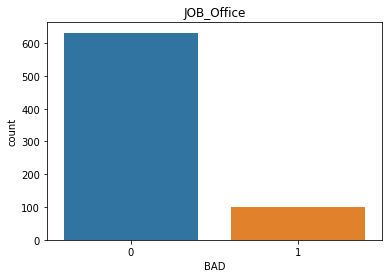

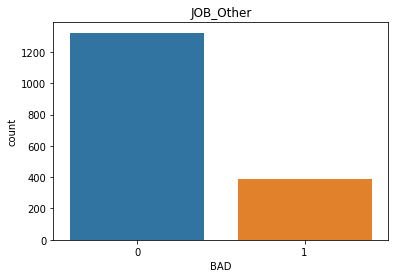

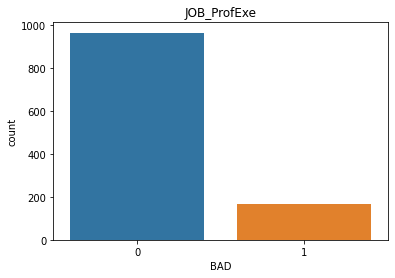

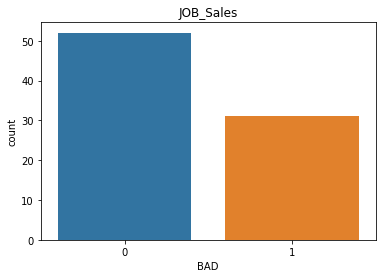

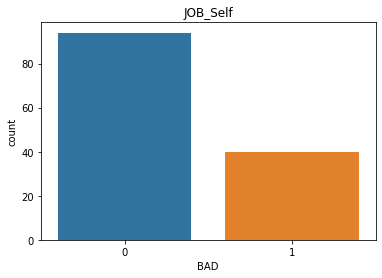

In [21]:
# plotting only the ones that Accepts H1
for i in res_chi[res_chi['Hypothesis'] == 'Accept H1']['Pair']:
    sns.countplot(mydata[mydata[i.split('_')[0]] == (i.split('_')[1])]['BAD'])
    plt.title(i)
    plt.show()

In [23]:
## A/B testing for categorical-continuous columns
from scipy.stats import mannwhitneyu
mann = []
for i in mydata.drop('BAD', axis=1).select_dtypes('number').columns:
    if mannwhitneyu(mydata[mydata['BAD'] == 0][i], 
                    mydata[mydata['BAD'] == 1][i])[1] < 0.05:
        mann.append('Accept H1')
    else:
        mann.append('Accept H0')

res = pd.DataFrame(data = [list(mydata.drop('BAD', axis=1).select_dtypes('number').columns), mann]).T
res.columns = ['Columns', 'Hypothesis']
res

,Columns,Hypothesis
0,LOAN,Accept H1
1,MORTDUE,Accept H1
2,VALUE,Accept H1
3,YOJ,Accept H1
4,DELINQ,Accept H1
5,CLAGE,Accept H1
6,NINQ,Accept H1
7,CLNO,Accept H0


In terms of Mann-Whitney U test:
- Since H0 is accepted, there seems to be no significant difference in data distribution within BAD categories in terms of CLNO value. It could also be said that there's an equal probability that a randomly drawn observation from one BAD category is larger than a randomly drawn observation from the other category.  
- Since H1 is accepted, there seems to be significant differences in data distribution within BAD categories in terms of LOAN, MORTDUE, VALUE, YOJ, DELINQ, CLAGE, and NINQ value. It could also be said that there's an unequal probability that a randomly drawn observation from one BAD category is larger than a randomly drawn observation from the other category.

In [24]:
# picking only the ones that Accepts H1
res[res['Hypothesis'] == 'Accept H1']

,Columns,Hypothesis
0,LOAN,Accept H1
1,MORTDUE,Accept H1
2,VALUE,Accept H1
3,YOJ,Accept H1
4,DELINQ,Accept H1
5,CLAGE,Accept H1
6,NINQ,Accept H1


## 4. [MODEL DEVELOPMENT]

In [3]:
# creating dummy variables so all the data are numerical
mydummy = pd.get_dummies(data= mydata, drop_first= True, columns = ['REASON','JOB'])
mydummy.columns

Index(['BAD', 'LOAN', 'MORTDUE', 'VALUE', 'YOJ', 'DELINQ', 'CLAGE', 'NINQ',
       'CLNO', 'REASON_HomeImp', 'JOB_Office', 'JOB_Other', 'JOB_ProfExe',
       'JOB_Sales', 'JOB_Self'],
      dtype='object')

In [4]:
# selecting features
IV = ['LOAN', 'MORTDUE', 'VALUE', 'YOJ', 'DELINQ', 'CLAGE', 'NINQ',
       'CLNO', 'REASON_HomeImp', 'JOB_Office', 'JOB_Other', 'JOB_ProfExe',
       'JOB_Sales', 'JOB_Self']

# independent variables
x = mydummy[IV]

# dependent/target variable
y = mydummy['BAD']

## 4.1 [OUTLIER-CLUSTERING ANALYSIS]

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 <a list of 15 Text major ticklabel objects>)

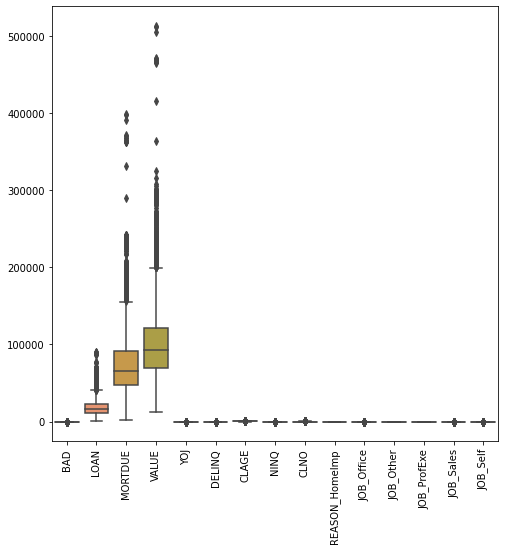

In [42]:
# first, lets use the boxplot to show how the data is distributed
plt.figure(figsize = (8,8))
sns.boxplot(data = mydummy)
plt.xticks(rotation = 90)

- From the boxplot we could see that the scale of the data isn't similar. Let's rescale the data by using the StandardScaler and check it one more time

In [43]:
# creating dummy copy 
from sklearn.preprocessing import StandardScaler
dummy = mydummy.copy()

# rescaling the data 
scaler = StandardScaler()
dummy = scaler.fit_transform(dummy)
dummy = pd.DataFrame(dummy, columns = mydummy.columns)
dummy = dummy.drop('BAD', axis=1)
dummy.head()

,LOAN,MORTDUE,VALUE,YOJ,DELINQ,CLAGE,NINQ,CLNO,REASON_HomeImp,JOB_Office,JOB_Other,JOB_ProfExe,JOB_Sales,JOB_Self
0,-1.598112,-1.087201,-1.215065,0.183858,-0.398033,-1.004883,-0.115995,-1.375748,1.547349,-0.446420,1.254599,-0.588288,-0.138675,-0.177253
1,-1.579708,-0.101531,-0.678564,-0.278060,1.410798,-0.674887,-0.709321,-0.856377,1.547349,-0.446420,1.254599,-0.588288,-0.138675,-0.177253
2,-1.561304,-1.362876,-1.622805,-0.673990,-0.398033,-0.342888,-0.115995,-1.271874,1.547349,-0.446420,1.254599,-0.588288,-0.138675,-0.177253
3,-1.542901,0.517332,0.117739,-0.805966,-0.398033,-1.017298,-0.709321,-0.856377,1.547349,2.240041,-0.797067,-0.588288,-0.138675,-0.177253
4,-1.542901,-0.982641,-1.191413,-0.014107,-0.398033,-0.919589,-0.115995,-1.479622,1.547349,-0.446420,1.254599,-0.588288,-0.138675,-0.177253


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 <a list of 14 Text major ticklabel objects>)

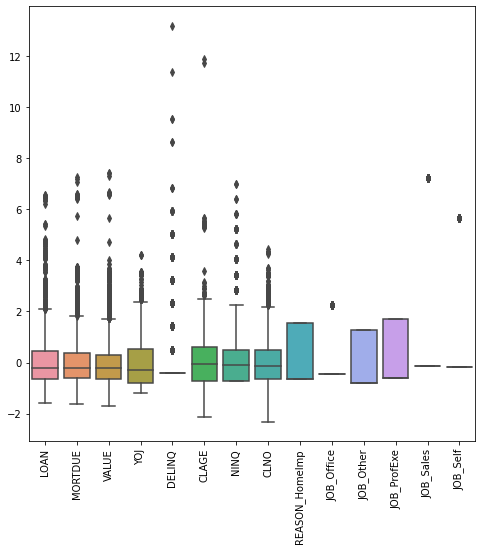

In [44]:
# after rescaling, lets use the boxplot to show how the data is now distributed
plt.figure(figsize = (8,8))
sns.boxplot(data = dummy)
plt.xticks(rotation = 90)

- From the boxplot we could see that the scale of the data is now, more or less, on a level.

In [45]:
# let'use the PCA to reduce our 14 features to 10 columns
from sklearn.decomposition import PCA
pca = PCA(n_components=10, random_state=101)
pca.fit(dummy)
x_pca = pca.transform(dummy)

In [46]:
# displaying PCA columns
x_pca = pd.DataFrame(x_pca, columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10'])
x_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-2.911930,-0.322606,0.973061,-1.118299,0.761779,0.712612,0.198281,-0.464613,-0.600617,0.492698
1,-1.937079,-0.411232,0.767955,-0.589197,0.527995,1.835652,0.212771,-1.133069,0.886852,0.620984
2,-3.097488,-0.445283,0.820727,-1.159742,0.627520,0.810518,0.375423,-0.461622,-0.546887,-0.323753
3,-0.658788,-1.871739,-1.779762,-1.156994,1.654091,0.245098,-0.117116,-1.492190,-0.288677,0.571289
4,-2.839909,-0.283295,0.924228,-1.232272,0.792917,0.701976,0.211512,-0.507429,-0.546119,0.443538
...,...,...,...,...,...,...,...,...,...,...
4394,0.985611,2.965202,1.362376,1.397917,1.618346,-2.950956,-0.434704,1.932064,1.642972,0.801120
4395,0.920877,2.999659,1.324007,1.293920,1.653710,-2.963302,-0.460182,1.978585,1.675299,0.908520
4396,0.928496,3.009785,1.283718,1.247184,1.647007,-2.950699,-0.443435,1.962818,1.699753,0.832432
4397,0.924152,3.027647,1.229506,1.244269,1.613366,-2.926390,-0.420869,1.966005,1.721127,0.711177


In [47]:
# describing the explanation ratio of each PC line
pca.explained_variance_ratio_

array([0.19002453, 0.10232362, 0.09342049, 0.09002468, 0.08253631,
       0.07769282, 0.07432476, 0.06295356, 0.0611812 , 0.05705996])

From the pca explained variance ratio function, we could see that:
- PC1 could explain 19.00 % of the data
- PC2 could explain 10.23 % of the data
- PC3 could explain 9.34 % of the data
- PC4 could explain 9.00 % of the data
- PC5 could explain 8.25 % of the data
- PC6 could explain 7.77 % of the data
- PC7 could explain 7.43 % of the data
- PC8 could explain 6.30 % of the data
- PC9 could explain 6.12 % of the data
- PC10 could explain 5.71 % of the data

In [48]:
# sum the total pca explained variance ratio (in %)
sum(pca.explained_variance_ratio_)

0.8915419265170825

- All the PC line in our analysis could explain in total 89.15 % of our data

In [49]:
# inserting the BAD column into the PCA columns
x_pca['BAD'] = mydummy['BAD']

In [79]:
# inserting a new column based on HDBSCAN labels
from hdbscan import HDBSCAN
hdbscan = HDBSCAN(min_cluster_size = 2, min_samples = 25)
hdbscan.fit(x_pca[['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']])
x_pca['HDBScan'] = hdbscan.labels_

In [86]:
# identifying the numbers of clusters
n_clusters = len(set(hdbscan.labels_)) - (1 if -1 in hdbscan.labels_ else 0)
n_clusters

3

In [87]:
# identifying the numbers of noise/outliers
n_noise = list(hdbscan.labels_).count(-1)
n_noise

37

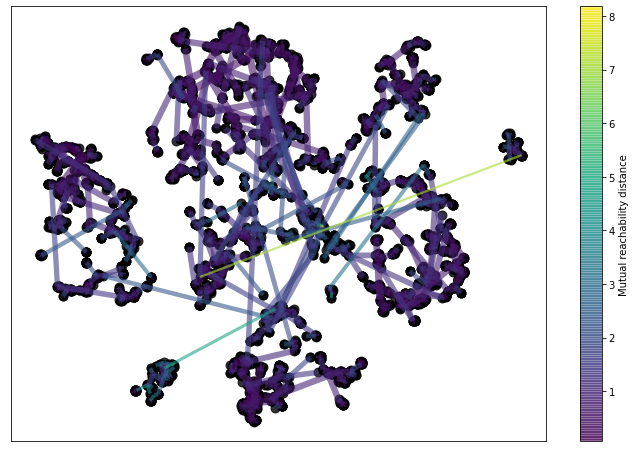

In [88]:
# plotting the minimun spanning tree
hdbscan = HDBSCAN(min_cluster_size=3, gen_min_span_tree=True)
hdbscan.fit(x_pca[['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']])
plt.figure(figsize=(12,8))
hdbscan.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                    edge_alpha=0.6,
                                    node_size=80,
                                    edge_linewidth=2)

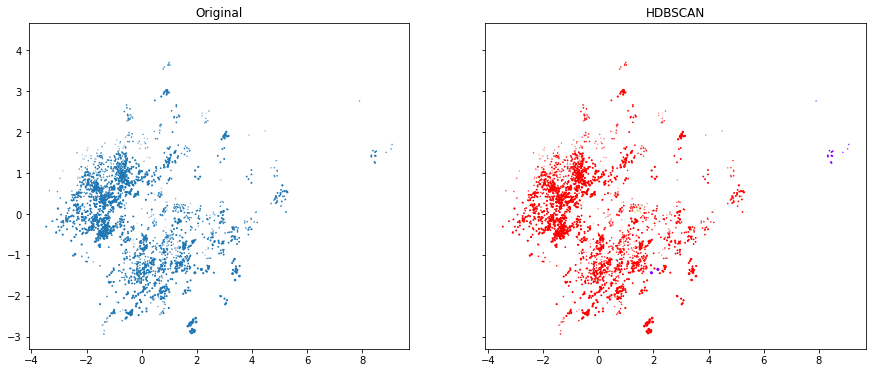

In [82]:
# plotting the clusters

f, (ax1, ax2) = plt.subplots(1,2, sharey = True, figsize = (15,6))

ax1.set_title('Original')
ax1.scatter(x_pca['PC1'], x_pca['PC2'], x_pca['PC3'])

ax2.set_title('HDBSCAN')
ax2.scatter(x_pca['PC1'], x_pca['PC2'], x_pca['PC3'],c=x_pca['HDBScan'], cmap = 'rainbow')

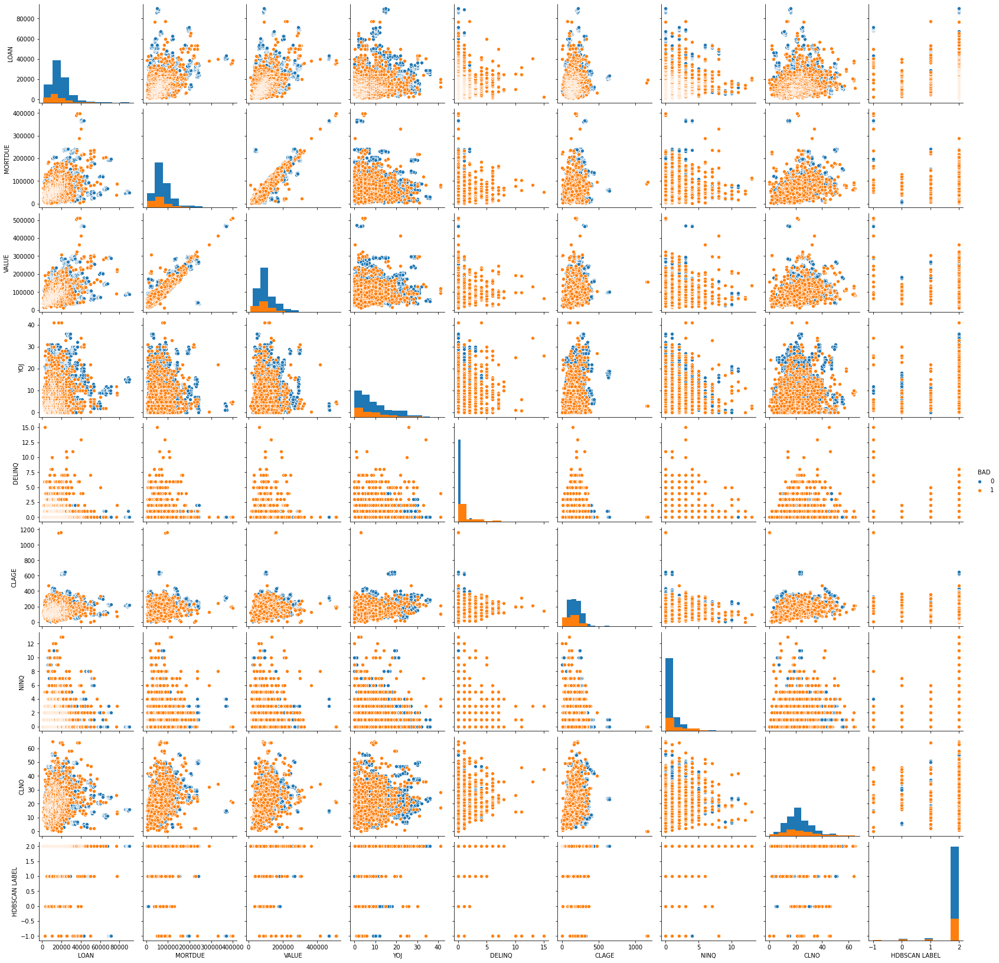

In [83]:
# pairplotting the whole data
df = mydata.copy()
df['HDBSCAN LABEL'] = x_pca['HDBScan']
sns.pairplot(df, hue = 'BAD', diag_kind = 'hist')

In [84]:
# showing the grouped by clusters description (outlier = -1)
pd.options.display.max_rows = 121
df.groupby('HDBSCAN LABEL').describe().T

HDBSCAN LABEL             -1              0              1              2
BAD     count      37.000000      83.000000     118.000000    4161.000000
        mean        0.459459       0.373494       0.296610       0.186253
        std         0.505228       0.486672       0.458711       0.389358
        min         0.000000       0.000000       0.000000       0.000000
        25%         0.000000       0.000000       0.000000       0.000000
        50%         0.000000       0.000000       0.000000       0.000000
        75%         1.000000       1.000000       1.000000       0.000000
        max         1.000000       1.000000       1.000000       1.000000
LOAN    count      37.000000      83.000000     118.000000    4161.000000
        mean    45143.243243   14939.759036   27630.508475   18040.591204
        std     18811.248711    8300.190121   14866.853560   10252.181453
        min      2800.000000    3300.000000    5000.000000    1100.000000
        25%     36600.000000    7600.000000   16475.000000   11200.000000
        50%     40700.000000   14300.000000   24250.000000   16000.000000
        75%     68100.000000   18600.000000   41350.000000   22600.000000
        max     71200.000000   40000.000000   77400.000000   89900.000000
MORTDUE count      37.000000      83.000000     118.000000    4161.000000
        mean   224647.729730   70522.927711  104289.050847   72510.636210
        std    119100.909974   30188.018102   66339.895339   40388.937176
        min     50795.000000    2619.000000    6000.000000    2800.000000
        25%    107343.000000   62882.000000   45758.750000   47537.000000
        50%    196690.000000   70451.000000   95582.000000   64423.000000
        75%    362909.000000   88082.500000  145473.250000   89595.000000
        max    399412.000000  129319.000000  242111.000000  290000.000000
VALUE   count      37.000000      83.000000     118.000000    4161.000000
        mean   307783.702703   95194.060241  153412.228814  102604.603989
        std    142460.499357   37684.018624   61708.875093   49191.916086
        min     63100.000000   34000.000000   36600.000000   12500.000000
        25%    192642.000000   68112.500000  110914.750000   69086.000000
        50%    293252.000000   84368.000000  132285.000000   91704.000000
        75%    466755.000000  106670.500000  187411.750000  118924.000000
        max    512650.000000  184561.000000  305514.000000  364000.000000
YOJ     count      37.000000      83.000000     118.000000    4161.000000
        mean        8.275676       7.386747       6.124576       9.233165
        std         7.954258       7.301433       4.145700       7.635164
        min         0.700000       0.000000       0.000000       0.000000
        25%         3.000000       2.000000       3.000000       3.000000
        50%         5.000000       5.000000       6.000000       8.000000
        75%        10.000000      11.500000       8.000000      14.000000
        max        34.000000      30.000000      22.000000      41.000000
DELINQ  count      37.000000      83.000000     118.000000    4161.000000
        mean        2.459459       0.277108       0.372881       0.427301
        std         4.555794       0.630781       0.903900       1.022377
        min         0.000000       0.000000       0.000000       0.000000
        25%         0.000000       0.000000       0.000000       0.000000
        50%         0.000000       0.000000       0.000000       0.000000
        75%         1.000000       0.000000       0.000000       0.000000
        max        15.000000       2.000000       5.000000       8.000000
CLAGE   count      37.000000      83.000000     118.000000    4161.000000
        mean      283.671143     185.327436     195.889816     176.413584
        std       222.403819      87.372023      65.552597      80.711974
        min         6.133333       9.048515       0.000000       0.000000
        25%       208.299007     126.338134     168.026455     115.136885
    

In [59]:
df.groupby('HDBSCAN LABEL').describe(exclude='number').T

HDBSCAN LABEL       -1        0        1        2
REASON count        37       83      118     4161
       unique        2        2        2        2
       top     DebtCon  DebtCon  HomeImp  DebtCon
       freq         22       72       64     2955
JOB    count        37       83      118     4161
       unique        5        1        1        4
       top        Self    Sales     Self    Other
       freq         16       83      118     1704

From the observations: 
- HDBSCAN has identified a cluster of outliers identified with the label of -1 & amounts to 37 datapoints
- This cluster is interesting because they have the highest group mean that approximates the loan default value of 1 (BAD category), with the mean value of 0.5, which also means that this cluster has the highest tendency to default, in relative to other clusters. 
- If we dig a little deeper, the outlier cluster starts to show intriguing numbers such as:
        - highest loan requested amount (LOAN) mean of USD 45.143
        - highest amount due on existing mortgage (MORTDUE) mean of USD 224.648
        - highest current property value (VALUE) mean of USD 307.784
        - highest amount of delinquent credit lines (DELINQ) mean of 2,5 credit lines
        - highest age of credit/trade line in months (CLAGE) mean of 283,6 months 
        - highest amount of recent credit lines (NINQ) mean of 2,7 credit lines
        - highest JOB category of "Self"
- An interesting note is that DELINQ, as we've reviewed & analyzed before, has the highest support for its connection towards loan default. If this cluster has the highest mean of DELINQ, we should take precaution. Not to mention that they have higher amount of loan requested, of existing mortgage, of credit line months, and of recent credit lines, which probably makes them tougher on their credit scorings.  
- In other words, if a member of this cluster applies for a loan, they should be considered with greater caution for they have a bigger likelihood to default 
- For further predictive analysis, let's start to make our prediction models & split our data


## 4.2 [SPLITTING DATA]

In [5]:
# splitting the training data - test data = 80% : 20% 
from sklearn.model_selection import train_test_split 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state= 101)

## 4.3 [SMOTE RESAMPLING]

In [6]:
# create a new x_train & y_train variable (x_trainres & y_trainres) that is resampled using SMOTE method
from imblearn.over_sampling import SMOTE
from collections import Counter

y_train = y_train.astype('int') 
smo = SMOTE(random_state=0, sampling_strategy='minority')
x_trainres, y_trainres = smo.fit_resample(x_train, y_train)
print(sorted(Counter(y_trainres).items()))


[(0, 2847), (1, 2847)]


In [10]:
# independent feature train shape
x_train.shape

(3519, 14)

In [11]:
# independent feature resampled train shape
x_trainres.shape

(5694, 14)

## 4.4 [DECISION TREE REPORTS]

In [11]:
# model fitting for normal data
from sklearn.tree import DecisionTreeClassifier

dtree = DecisionTreeClassifier()

dtree.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [12]:
# model fitting for oversampled data
dtree2 = DecisionTreeClassifier()

dtree2.fit(x_trainres,y_trainres)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [14]:
# classification report for normal data

from sklearn.metrics import classification_report,confusion_matrix
dtree_pred = dtree.predict(x_test)
dtree_predprob = dtree.predict_proba(x_test)
print(classification_report(y_test, dtree_pred))

# classification report for oversampled data

dtree_pred2 = dtree2.predict(x_test)
dtree_predprob2 = dtree2.predict_proba(x_test)
print(classification_report(y_test, dtree_pred2))

              precision    recall  f1-score   support

           0       0.90      0.95      0.93       694
           1       0.77      0.62      0.68       186

    accuracy                           0.88       880
   macro avg       0.83      0.78      0.81       880
weighted avg       0.87      0.88      0.87       880

              precision    recall  f1-score   support

           0       0.90      0.93      0.92       694
           1       0.71      0.63      0.67       186

    accuracy                           0.87       880
   macro avg       0.81      0.78      0.79       880
weighted avg       0.86      0.87      0.87       880



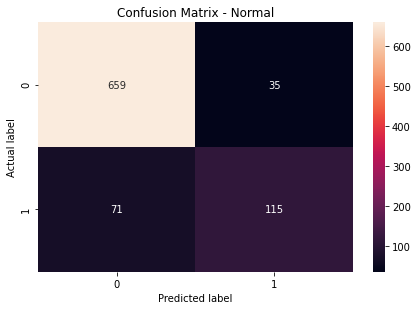

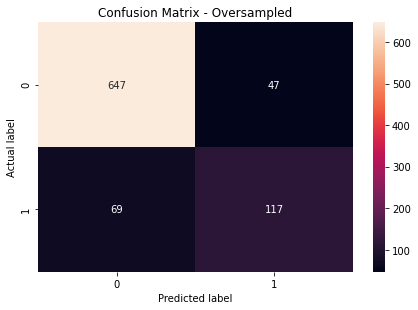

In [58]:
# confusion matrix for normal data

cnf_matrix = confusion_matrix(y_test, dtree_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Normal')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

# confusion matrix for oversampled data

cnf_matrix = confusion_matrix(y_test, dtree_pred2)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


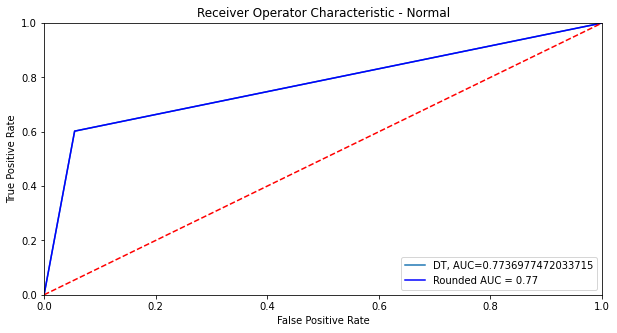

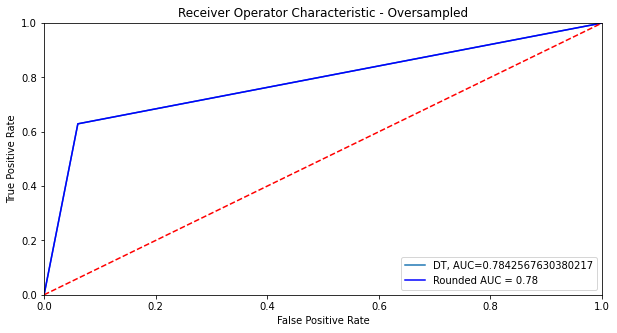

In [37]:
from sklearn import metrics

# ROC - AUC Score for normal data
dtree_pred_proba = dtree.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  dtree_pred_proba)
auc = metrics.roc_auc_score(y_test, dtree_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Normal')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# ROC - AUC Score for oversampled data
dtree_pred_proba2 = dtree2.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  dtree_pred_proba2)
auc = metrics.roc_auc_score(y_test, dtree_pred_proba2)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Oversampled')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()




Cross validation - Normal Data scores: [0.76475517 0.83364755 0.76428384 0.8029327  0.81170463 0.83453784
 0.7572663  0.81679785 0.78065452 0.83003994]


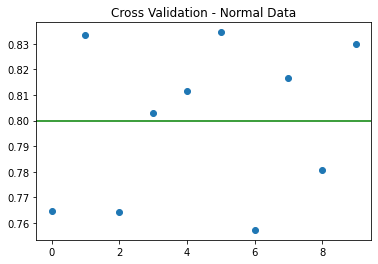

Cross Validation - Oversampled Data scores: [0.80701754 0.80350877 0.90877193 0.93508772 0.94378552 0.95255127
 0.94381023 0.93844206 0.94195701 0.94899926]


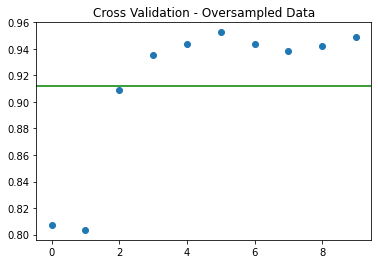

In [42]:
from sklearn.model_selection import cross_val_score

# Cross Validation score for normal data
dtreescores = cross_val_score(estimator=dtree,
                        X=x_train,
                        y=y_train,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')

print('Cross validation - Normal Data scores: {}'.format(dtreescores))
plt.title('Cross Validation - Normal Data')
plt.scatter(np.arange(len(dtreescores)), dtreescores)
plt.axhline(y=np.mean(dtreescores), color='g') # Mean value of cross validation scores
plt.show()

# Cross Validation score for oversampled data
dtreescores2 = cross_val_score(estimator=dtree2,
                        X=x_trainres,
                        y=y_trainres,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')
print('Cross Validation - Oversampled Data scores: {}'.format(dtreescores2))
plt.title('Cross Validation - Oversampled Data')
plt.scatter(np.arange(len(dtreescores2)), dtreescores2)
plt.axhline(y=np.mean(dtreescores2), color='g') # Mean value of cross validation scores
plt.show()

In [38]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot 

dot_data = StringIO()  
export_graphviz(dtree, out_file = dot_data, feature_names = x_train.columns, filled=True, rounded=True, special_characters=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())  

- We can see that the root node is taken by the DELINQ feature. It shows that the DELINQ is the main feature being used in the gaining information thorugh splitting of the nodes in this normal data.

In [39]:
dot_data = StringIO()  
export_graphviz(dtree2, out_file = dot_data, feature_names = x_trainres.columns, filled=True, rounded=True, special_characters=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png()) 

- We can see that the root node is once again taken by the DELINQ feature. It shows that the DELINQ is still the main feature being used in gaining more information through the splitting of the nodes in this oversampled data

In [40]:
from eli5 import show_weights
from eli5.sklearn import PermutationImportance

# permutation importance for normal data
dtreeperm = PermutationImportance(dtree, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(dtreeperm, feature_names = list(x_test.columns))

Weight,Feature
0.1103 ± 0.0361,CLAGE
0.0712 ± 0.0125,DELINQ
0.0655 ± 0.0145,VALUE
0.0528 ± 0.0273,LOAN
0.0509 ± 0.0260,YOJ
0.0508 ± 0.0134,MORTDUE
0.0502 ± 0.0182,CLNO
0.0258 ± 0.0218,NINQ
0.0234 ± 0.0062,JOB_ProfExe
0.0204 ± 0.0070,JOB_Office


In [41]:
# permutation importance for oversampled data
dtreeperm2 = PermutationImportance(dtree2, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(dtreeperm2, feature_names = list(x_test.columns))

Weight,Feature
0.0978 ± 0.0096,CLAGE
0.0978 ± 0.0170,DELINQ
0.0919 ± 0.0102,NINQ
0.0895 ± 0.0296,CLNO
0.0720 ± 0.0180,LOAN
0.0685 ± 0.0258,VALUE
0.0638 ± 0.0138,YOJ
0.0498 ± 0.0181,MORTDUE
0.0228 ± 0.0023,JOB_Other
0.0109 ± 0.0129,JOB_Office


- From the permutation feature importance, we can see the green features that contribute the most to the drop of the overall model scores if the the feature's values are randomly shuffled. Those top features that are consistent in the darkest of green shades (in the normal & oversampled data) are only CLAGE & DELINQ feature. Special notice for NINQ & CLNO that came amongst the top in the oversampled data. In other words, all of these features are important for our model in predicting BAD categories.

## 4.5 [RANDOM FOREST REPORTS]

In [49]:
# model fitting for normal data

from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(random_state= 190, n_estimators=1000)
rfc.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=190,
                       verbose=0, warm_start=False)

In [50]:
# model fitting for oversampled data

from sklearn.ensemble import RandomForestClassifier
rfc2 = RandomForestClassifier(random_state= 190, n_estimators=1000)
rfc2.fit(x_trainres, y_trainres)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=190,
                       verbose=0, warm_start=False)

In [51]:
# classification report for normal data

rfc_pred = rfc.predict(x_test)
rfc_predprob = rfc.predict_proba(x_test)
print(classification_report(y_test, rfc_pred))

# classification report for oversampled data

rfc_pred2 = rfc2.predict(x_test)
rfc_predprob2 = rfc2.predict_proba(x_test)
print(classification_report(y_test, rfc_pred2))

              precision    recall  f1-score   support

           0       0.91      1.00      0.95       694
           1       0.99      0.61      0.76       186

    accuracy                           0.92       880
   macro avg       0.95      0.81      0.85       880
weighted avg       0.92      0.92      0.91       880

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       694
           1       0.97      0.75      0.84       186

    accuracy                           0.94       880
   macro avg       0.95      0.87      0.90       880
weighted avg       0.94      0.94      0.94       880



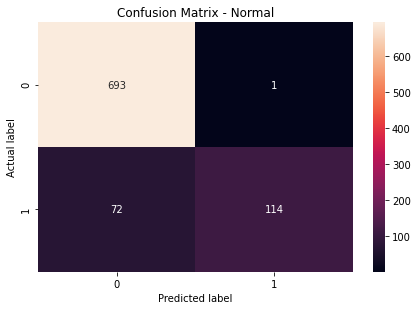

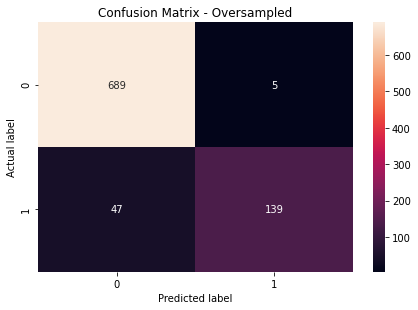

In [56]:
# confusion matrix for normal data

cnf_matrix = confusion_matrix(y_test, rfc_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Normal')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

# confusion matrix for oversampled data

cnf_matrix = confusion_matrix(y_test, rfc_pred2)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


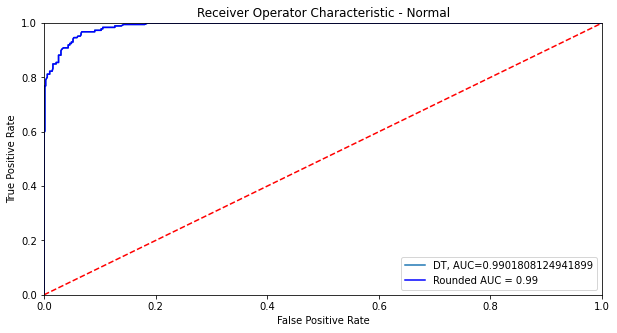

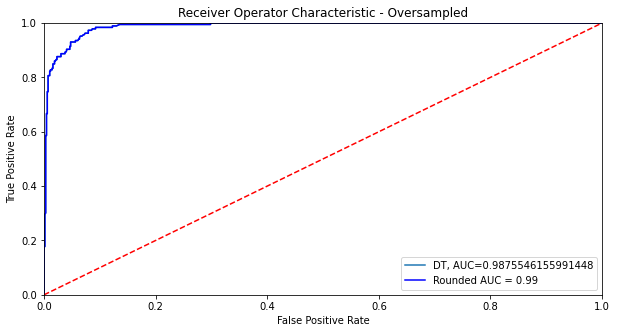

In [47]:
# ROC - AUC Score for normal data
rfc_pred_proba = rfc.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  rfc_pred_proba)
auc = metrics.roc_auc_score(y_test, rfc_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Normal')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# ROC - AUC Score for oversampled data
rfc_pred_proba2 = rfc2.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  rfc_pred_proba2)
auc = metrics.roc_auc_score(y_test, rfc_pred_proba2)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Oversampled')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Cross validation - Normal Data scores: [0.98976172 0.9800995  0.97501964 0.9818277  0.97978528 0.97509819
 0.96161299 0.99099006 0.98348177 0.97251419]


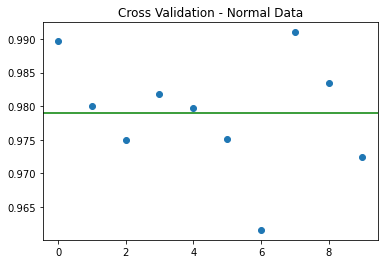

Cross Validation - Oversampled Data scores: [0.98839643 0.98099723 0.99604186 0.99905202 0.99899926 0.99765258
 0.99949963 0.9997529  0.99953052 0.99861626]


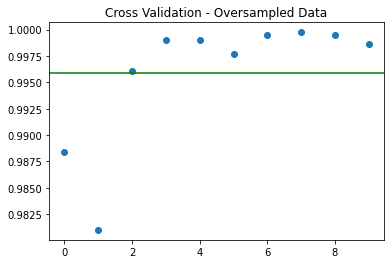

In [51]:
# Cross Validation score for normal data
rfcscores = cross_val_score(estimator=rfc,
                        X=x_train,
                        y=y_train,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')

print('Cross validation - Normal Data scores: {}'.format(rfcscores))
plt.title('Cross Validation - Normal Data')
plt.scatter(np.arange(len(rfcscores)), rfcscores)
plt.axhline(y=np.mean(rfcscores), color='g') # Mean value of cross validation scores
plt.show()

# Cross Validation score for oversampled data
rfcscores2 = cross_val_score(estimator=rfc2,
                        X=x_trainres,
                        y=y_trainres,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')
print('Cross Validation - Oversampled Data scores: {}'.format(rfcscores2))
plt.title('Cross Validation - Oversampled Data')
plt.scatter(np.arange(len(rfcscores2)), rfcscores2)
plt.axhline(y=np.mean(rfcscores2), color='g') # Mean value of cross validation scores
plt.show()

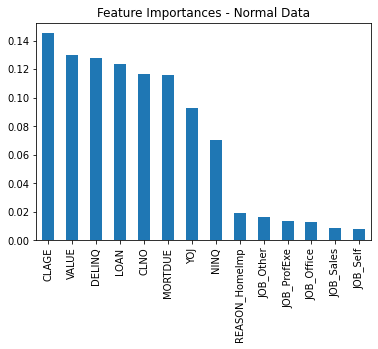

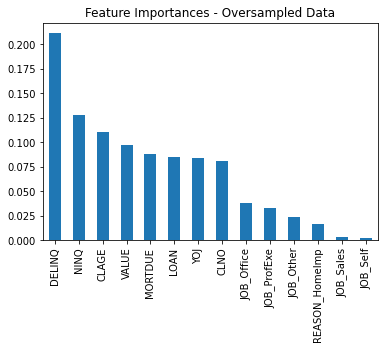

In [48]:
# Feature Importance for normal data
rfc_coef1 = pd.Series(rfc.feature_importances_, x_train.columns).sort_values(ascending= False)
rfc_coef1.plot(kind = 'bar', title='Feature Importances - Normal Data')
plt.show()

# Feature Importance for oversampled data
rfc_coef2 = pd.Series(rfc2.feature_importances_, x_trainres.columns).sort_values(ascending= False)
rfc_coef2.plot(kind = 'bar', title='Feature Importances - Oversampled Data')
plt.show()

- From the feature importance, we can see which features that contribute to the most information gained. Those top features that are consistent in the top three (in the normal & oversampled data) are DELINQ & CLAGE feature. Special notice for NINQ & VALUE that appears to approximate the top features in both data. In other words, all of these features are important for our model in predicting BAD categories.

In [49]:
# permutation importance for normal data
rfcperm = PermutationImportance(rfc, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(rfcperm, feature_names = list(x_test.columns))

Weight,Feature
0.1121 ± 0.0139,CLAGE
0.0766 ± 0.0062,DELINQ
0.0482 ± 0.0030,VALUE
0.0429 ± 0.0083,LOAN
0.0428 ± 0.0033,NINQ
0.0412 ± 0.0040,MORTDUE
0.0394 ± 0.0114,CLNO
0.0387 ± 0.0021,YOJ
0.0158 ± 0.0035,JOB_Office
0.0098 ± 0.0018,JOB_Other


In [50]:
# permutation importance for oversampled data
rfcperm2 = PermutationImportance(rfc2, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(rfcperm2, feature_names = list(x_test.columns))

Weight,Feature
0.1003 ± 0.0119,CLAGE
0.0925 ± 0.0053,DELINQ
0.0595 ± 0.0082,NINQ
0.0413 ± 0.0103,CLNO
0.0401 ± 0.0065,VALUE
0.0396 ± 0.0094,LOAN
0.0360 ± 0.0070,JOB_Office
0.0339 ± 0.0048,YOJ
0.0307 ± 0.0042,JOB_ProfExe
0.0277 ± 0.0037,MORTDUE


- From the permutation feature importance, we can see the green features that contribute the most to the drop of the overall model scores if the the feature's values are randomly shuffled. Those top features that are consistent in the darkest of green shades (in the normal & oversampled data) are only CLAGE & DELINQ feature. Special notice for NINQ that came amongst the top in the oversampled data. In other words, all of these features are important for our model in predicting BAD categories.

## 4.6 [XGBOOST REPORTS]

In [59]:
# model fitting for normal data
from xgboost import XGBClassifier
xgb = XGBClassifier(learning_rate = 0.01, n_estimators = 10000, max_depth = None, n_jobs = -1)
xgb.fit(x_train, y_train)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.01, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=10000, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

In [60]:
# model fitting for oversampled data
xgb2 = XGBClassifier(learning_rate = 0.01, n_estimators = 10000, max_depth = None, n_jobs = -1)
xgb2.fit(x_trainres, y_trainres)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.01, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=10000, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

In [61]:
# classification report for normal data

xgb_pred = xgb.predict(x_test)
xgb_predprob = xgb.predict_proba(x_test)
print(classification_report(y_test, xgb_pred))

# classification report for oversampled data

xgb_pred2 = xgb2.predict(x_test)
xgb_predprob2 = xgb2.predict_proba(x_test)
print(classification_report(y_test, xgb_pred2))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95       694
           1       0.95      0.69      0.80       186

    accuracy                           0.93       880
   macro avg       0.94      0.84      0.88       880
weighted avg       0.93      0.93      0.92       880

              precision    recall  f1-score   support

           0       0.93      0.99      0.96       694
           1       0.94      0.74      0.83       186

    accuracy                           0.93       880
   macro avg       0.94      0.86      0.89       880
weighted avg       0.93      0.93      0.93       880



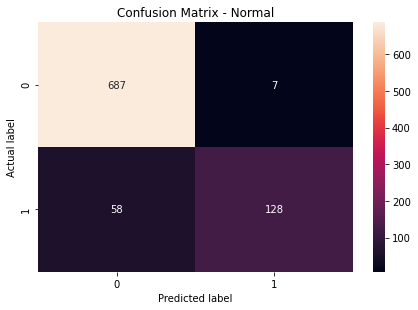

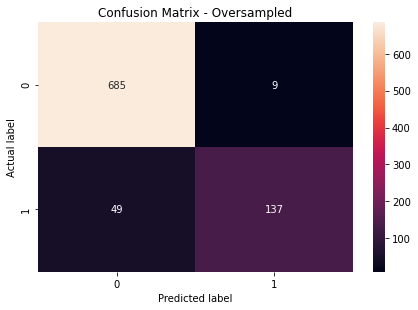

In [62]:
# confusion matrix for normal data

cnf_matrix = confusion_matrix(y_test, xgb_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Normal')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

# confusion matrix for oversampled data

cnf_matrix = confusion_matrix(y_test, xgb_pred2)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


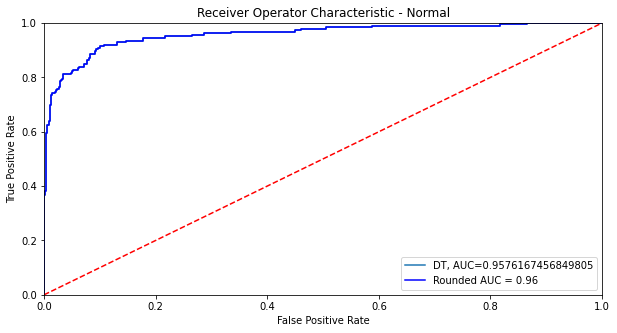

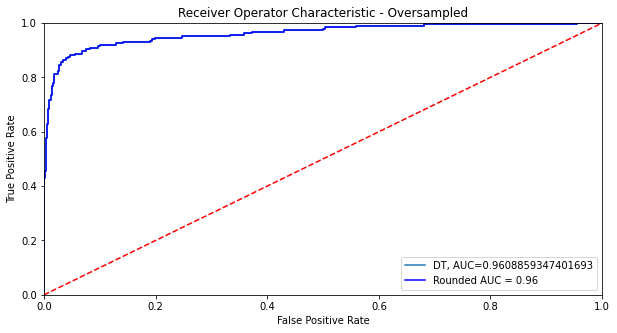

In [56]:
# ROC - AUC Score for normal data
xgb_pred_proba = xgb.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  xgb_pred_proba)
auc = metrics.roc_auc_score(y_test, xgb_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Normal')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# ROC - AUC Score for oversampled data
xgb_pred_proba2 = xgb2.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  xgb_pred_proba2)
auc = metrics.roc_auc_score(y_test, xgb_pred_proba2)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Oversampled')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Cross validation - Normal Data scores: [0.95710919 0.9505106  0.94050799 0.95585232 0.96496465 0.94501178
 0.94370254 0.96789561 0.93770713 0.92269287]


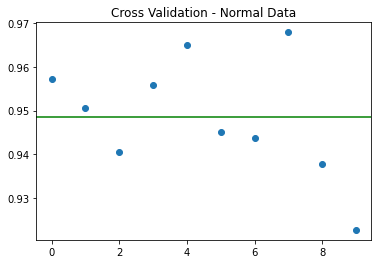

Cross Validation - Oversampled Data scores: [0.97519237 0.96341028 0.98461065 0.99950754 0.99962936 0.99848036
 0.99992587 0.99991352 0.99977761 0.99964171]


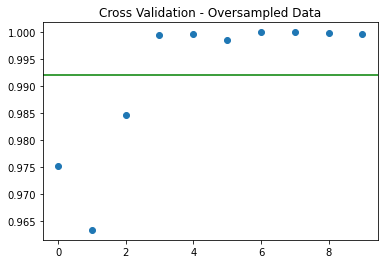

In [60]:
# Cross Validation score for normal data
xgbscores = cross_val_score(estimator=xgb,
                        X=x_train,
                        y=y_train,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')

print('Cross validation - Normal Data scores: {}'.format(xgbscores))
plt.title('Cross Validation - Normal Data')
plt.scatter(np.arange(len(xgbscores)), xgbscores)
plt.axhline(y=np.mean(xgbscores), color='g') # Mean value of cross validation scores
plt.show()

# Cross Validation score for oversampled data
xgbscores2 = cross_val_score(estimator=xgb2,
                        X=x_trainres,
                        y=y_trainres,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')
print('Cross Validation - Oversampled Data scores: {}'.format(xgbscores2))
plt.title('Cross Validation - Oversampled Data')
plt.scatter(np.arange(len(xgbscores2)), xgbscores2)
plt.axhline(y=np.mean(xgbscores2), color='g') # Mean value of cross validation scores
plt.show()

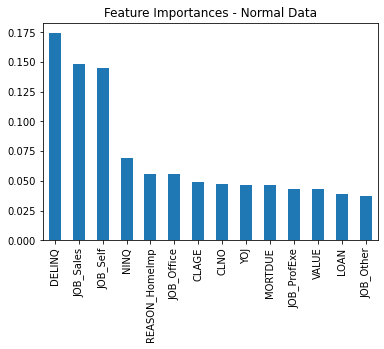

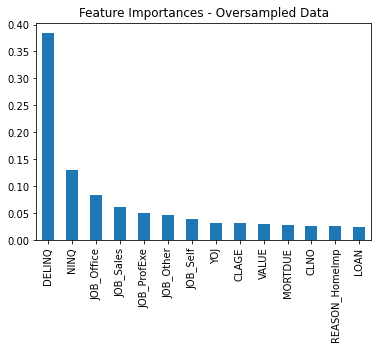

In [57]:
# Feature Importance for normal data
xgbcoef1 = pd.Series(xgb.feature_importances_, x_train.columns).sort_values(ascending= False)
xgbcoef1.plot(kind = 'bar', title='Feature Importances - Normal Data')
plt.show()

# Feature Importance for oversampled data
xgbcoef2 = pd.Series(xgb2.feature_importances_, x_trainres.columns).sort_values(ascending= False)
xgbcoef2.plot(kind = 'bar', title='Feature Importances - Oversampled Data')
plt.show()

- From the feature importance, we can see which features that contribute to the most information gained. Those top features that are consistent (in the normal & oversampled data) is DELINQ feature. Special notice for NINQ that appears to approximate the top features in both data. In other words, all of these features are important for our model in predicting BAD categories.

In [58]:
# permutation importance for normal data
xgbperm = PermutationImportance(xgb, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(xgbperm, feature_names = list(x_test.columns))

Weight,Feature
0.1052 ± 0.0153,CLAGE
0.0869 ± 0.0126,DELINQ
0.0712 ± 0.0056,MORTDUE
0.0587 ± 0.0128,CLNO
0.0583 ± 0.0080,VALUE
0.0580 ± 0.0062,LOAN
0.0513 ± 0.0094,YOJ
0.0348 ± 0.0086,NINQ
0.0273 ± 0.0195,JOB_Office
0.0083 ± 0.0031,JOB_ProfExe


In [59]:
# permutation importance for oversampled data
xgbperm2 = PermutationImportance(xgb2, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(xgbperm2, feature_names = list(x_test.columns))

Weight,Feature
0.0927 ± 0.0101,CLAGE
0.0866 ± 0.0097,DELINQ
0.0608 ± 0.0096,MORTDUE
0.0579 ± 0.0163,CLNO
0.0567 ± 0.0068,VALUE
0.0546 ± 0.0099,LOAN
0.0445 ± 0.0147,YOJ
0.0443 ± 0.0072,NINQ
0.0335 ± 0.0204,JOB_Office
0.0100 ± 0.0050,JOB_ProfExe


- From the permutation feature importance, we can see the green features that contribute the most to the drop of the overall model scores if the the feature's values are randomly shuffled. Those top features that are consistent in the darkest of green shades (in the normal & oversampled data) are only CLAGE & DELINQ feature. Special notice for MORTDUE that came amongst the top in both data. In other words, all of these features are important for our model in predicting BAD categories.

## 4.7 [NAIVE BAYES - BERNOULLI  REPORTS]

In [63]:
# model fitting for normal data
from sklearn.naive_bayes import BernoulliNB
nb = BernoulliNB()
nb.fit(x_train, y_train)

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [64]:
# model fitting for oversampled data
nb2 = BernoulliNB()
nb2.fit(x_trainres, y_trainres)

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [65]:
# classification report for normal data

nb_pred = nb.predict(x_test)
nb_predprob = nb.predict_proba(x_test)
print(classification_report(y_test, nb_pred))

# classification report for oversampled data

nb_pred2 = nb2.predict(x_test)
nb_predprob2 = nb2.predict_proba(x_test)
print(classification_report(y_test, nb_pred2))

              precision    recall  f1-score   support

           0       0.81      0.96      0.88       694
           1       0.54      0.16      0.24       186

    accuracy                           0.79       880
   macro avg       0.67      0.56      0.56       880
weighted avg       0.75      0.79      0.75       880

              precision    recall  f1-score   support

           0       0.84      0.82      0.83       694
           1       0.40      0.44      0.42       186

    accuracy                           0.74       880
   macro avg       0.62      0.63      0.63       880
weighted avg       0.75      0.74      0.75       880



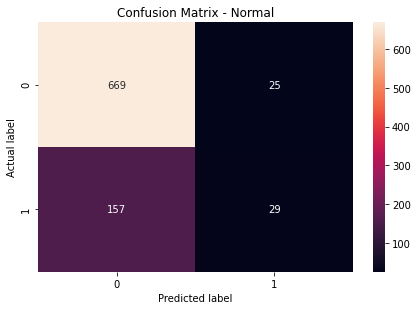

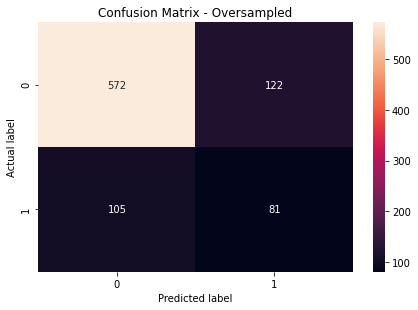

In [66]:
# confusion matrix for normal data

cnf_matrix = confusion_matrix(y_test, nb_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Normal')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

# confusion matrix for oversampled data

cnf_matrix = confusion_matrix(y_test, nb_pred2)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


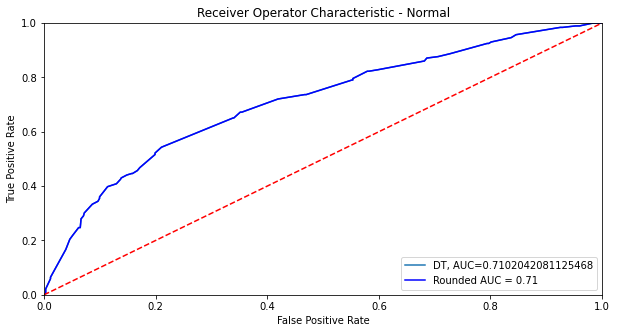

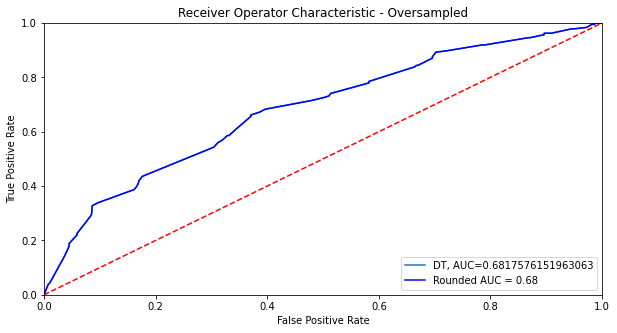

In [65]:
# ROC - AUC Score for normal data
nb_pred_proba = nb.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  nb_pred_proba)
auc = metrics.roc_auc_score(y_test, nb_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Normal')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# ROC - AUC Score for oversampled data
nb_pred_proba2 = nb2.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  nb_pred_proba2)
auc = metrics.roc_auc_score(y_test, nb_pred_proba2)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Oversampled')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Cross validation - Normal Data scores: [0.75202933 0.70780309 0.69478921 0.69714585 0.72393297 0.6885834
 0.68641005 0.70342274 0.72496375 0.72511562]


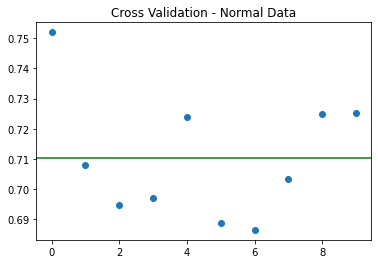

Cross Validation - Oversampled Data scores: [0.67943367 0.70667898 0.82717759 0.90864882 0.88575488 0.88176427
 0.90935878 0.88951693 0.9243699  0.88869533]


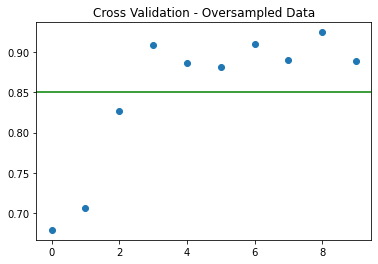

In [68]:
# Cross Validation score for normal data
nbscores = cross_val_score(estimator=nb,
                        X=x_train,
                        y=y_train,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')

print('Cross validation - Normal Data scores: {}'.format(nbscores))
plt.title('Cross Validation - Normal Data')
plt.scatter(np.arange(len(nbscores)), nbscores)
plt.axhline(y=np.mean(nbscores), color='g') # Mean value of cross validation scores
plt.show()

# Cross Validation score for oversampled data
nbscores2 = cross_val_score(estimator=nb2,
                        X=x_trainres,
                        y=y_trainres,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')
print('Cross Validation - Oversampled Data scores: {}'.format(nbscores2))
plt.title('Cross Validation - Oversampled Data')
plt.scatter(np.arange(len(nbscores2)), nbscores2)
plt.axhline(y=np.mean(nbscores2), color='g') # Mean value of cross validation scores
plt.show()

In [66]:
# permutation importance for normal data
nbperm = PermutationImportance(nb, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(nbperm, feature_names = list(x_test.columns))

Weight,Feature
0.1282 ± 0.0268,DELINQ
0.0223 ± 0.0129,NINQ
0.0178 ± 0.0158,JOB_Office
0.0101 ± 0.0102,JOB_ProfExe
0.0086 ± 0.0066,JOB_Other
0.0060 ± 0.0059,YOJ
0.0036 ± 0.0098,JOB_Sales
0.0033 ± 0.0031,CLAGE
0.0030 ± 0.0027,CLNO
0.0027 ± 0.0053,JOB_Self


In [67]:
# permutation importance for oversampled data
nbperm2 = PermutationImportance(nb2, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(nbperm2, feature_names = list(x_test.columns))

Weight,Feature
0.1156 ± 0.0279,DELINQ
0.0354 ± 0.0169,JOB_ProfExe
0.0347 ± 0.0206,JOB_Office
0.0346 ± 0.0202,NINQ
0.0066 ± 0.0102,YOJ
0.0013 ± 0.0009,CLNO
0.0008 ± 0.0009,CLAGE
0 ± 0.0000,VALUE
0 ± 0.0000,MORTDUE
0 ± 0.0000,LOAN


- From the permutation feature importance, we can see the green features that contribute the most to the drop of the overall model scores if the the feature's values are randomly shuffled. Those top features that are consistent in the darkest of green shades (in the normal & oversampled data) is only the DELINQ feature. Special notice for NINQ & JOB_Office that came amongst the top in both data. In other words, all of these features are important for our model in predicting BAD categories.

## 4.8 [KNN REPORTS]

In [67]:
# creating new dummy variable for scaling
mydummy2 = mydummy.copy()
mydummy2.columns

Index(['BAD', 'LOAN', 'MORTDUE', 'VALUE', 'YOJ', 'DELINQ', 'CLAGE', 'NINQ',
       'CLNO', 'REASON_HomeImp', 'JOB_Office', 'JOB_Other', 'JOB_ProfExe',
       'JOB_Sales', 'JOB_Self'],
      dtype='object')

In [68]:
# importing standard scaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(mydummy2.drop('BAD',axis=1))

StandardScaler(copy=True, with_mean=True, with_std=True)

In [69]:
# scaling features
scaled_features = scaler.transform(mydummy2.drop('BAD',axis=1))
df_feat = pd.DataFrame(scaled_features,columns=mydummy2.columns[1:])
df_feat.head()

,LOAN,MORTDUE,VALUE,YOJ,DELINQ,CLAGE,NINQ,CLNO,REASON_HomeImp,JOB_Office,JOB_Other,JOB_ProfExe,JOB_Sales,JOB_Self
0,-1.598112,-1.087201,-1.215065,0.183858,-0.398033,-1.004883,-0.115995,-1.375748,1.547349,-0.446420,1.254599,-0.588288,-0.138675,-0.177253
1,-1.579708,-0.101531,-0.678564,-0.278060,1.410798,-0.674887,-0.709321,-0.856377,1.547349,-0.446420,1.254599,-0.588288,-0.138675,-0.177253
2,-1.561304,-1.362876,-1.622805,-0.673990,-0.398033,-0.342888,-0.115995,-1.271874,1.547349,-0.446420,1.254599,-0.588288,-0.138675,-0.177253
3,-1.542901,0.517332,0.117739,-0.805966,-0.398033,-1.017298,-0.709321,-0.856377,1.547349,2.240041,-0.797067,-0.588288,-0.138675,-0.177253
4,-1.542901,-0.982641,-1.191413,-0.014107,-0.398033,-0.919589,-0.115995,-1.479622,1.547349,-0.446420,1.254599,-0.588288,-0.138675,-0.177253


In [70]:
# splitting data
X_Train, X_Test, Y_Train, Y_Test = train_test_split(scaled_features,mydummy2['BAD'],
                                                    test_size=0.20, random_state= 101)

In [71]:
# SMOTE resampling
Y_Train = Y_Train.astype('int') 
smo = SMOTE(random_state=0, sampling_strategy='minority')
X_Trainres, Y_Trainres = smo.fit_resample(X_Train, Y_Train)
print(sorted(Counter(Y_Trainres).items()))

[(0, 2847), (1, 2847)]


In [72]:
# model fitting for normal data
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_Train, Y_Train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [73]:
# model fitting for undersampled data
from sklearn.neighbors import KNeighborsClassifier
knn2 = KNeighborsClassifier(n_neighbors=3)
knn2.fit(X_Trainres, Y_Trainres)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [74]:
# classification report for normal data

knn_pred = knn.predict(X_Test)
knn_predprob = knn.predict_proba(X_Test)
print(classification_report(Y_Test, knn_pred))

# classification report for oversampled data

knn_pred2 = knn2.predict(X_Test)
knn_predprob2 = knn2.predict_proba(X_Test)
print(classification_report(Y_Test, knn_pred2))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94       694
           1       1.00      0.55      0.71       186

    accuracy                           0.90       880
   macro avg       0.95      0.77      0.83       880
weighted avg       0.91      0.90      0.89       880

              precision    recall  f1-score   support

           0       0.96      1.00      0.98       694
           1       0.99      0.84      0.91       186

    accuracy                           0.96       880
   macro avg       0.97      0.92      0.94       880
weighted avg       0.97      0.96      0.96       880



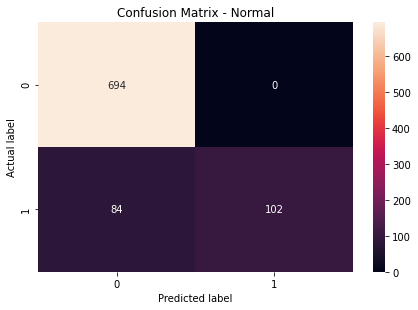

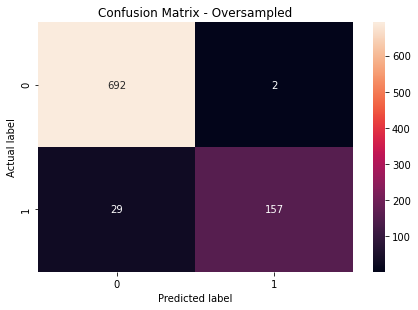

In [75]:
# confusion matrix for normal data

cnf_matrix = confusion_matrix(y_test, knn_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Normal')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

# confusion matrix for oversampled data

cnf_matrix = confusion_matrix(y_test, knn_pred2)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


In [76]:
# identifying error rates

error_rate = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_Train,Y_Train)
    pred_i = knn.predict(X_Test)
    error_rate.append(np.mean(pred_i != Y_Test))
    
error_rate2 = []
for i in range(1,40):
    knn2 = KNeighborsClassifier(n_neighbors=i)
    knn2.fit(X_Train,Y_Train)
    pred_i2 = knn2.predict(X_Test)
    error_rate2.append(np.mean(pred_i2 != Y_Test))

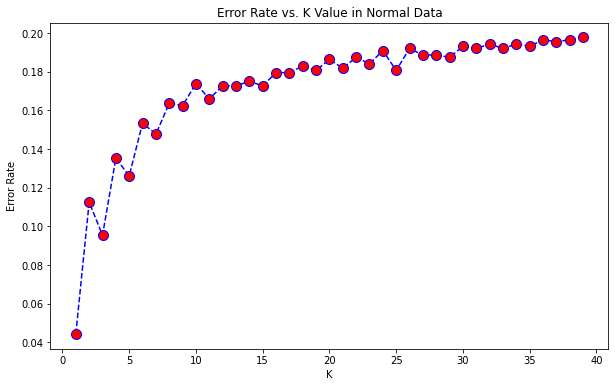

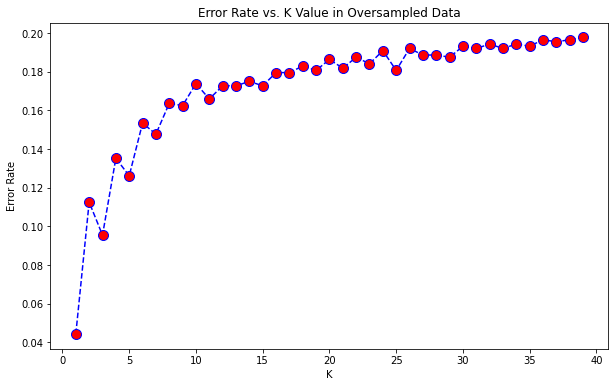

In [77]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value in Normal Data')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate2,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value in Oversampled Data')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()

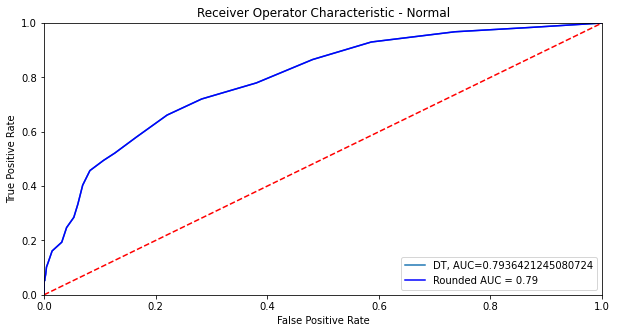

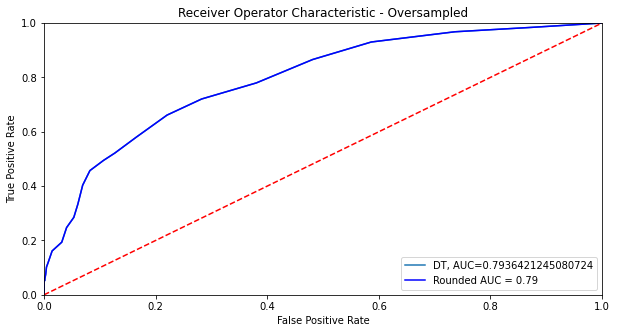

In [79]:
from sklearn import metrics

# ROC - AUC Score for normal data
knn_pred_proba = knn.predict_proba(X_Test)[::,1]
fpr, tpr, _ = metrics.roc_curve(Y_Test,  knn_pred_proba)
auc = metrics.roc_auc_score(Y_Test, knn_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Normal')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# ROC - AUC Score for oversampled data
knn_pred_proba2 = knn2.predict_proba(X_Test)[::,1]
fpr, tpr, _ = metrics.roc_curve(Y_Test,  knn_pred_proba2)
auc = metrics.roc_auc_score(Y_Test, knn_pred_proba2)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Oversampled')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Cross validation - Normal Data scores: [0.83932967 0.76150825 0.81610369 0.76080126 0.78033517 0.72977219
 0.81094527 0.82883699 0.80921189 0.76192979]


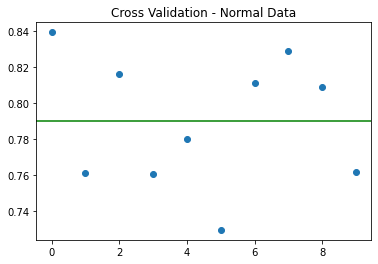

Cross Validation - Oversampled Data scores: [0.85588181 0.84543552 0.88053555 0.87221299 0.87296145 0.87454905
 0.88519274 0.88962812 0.88695948 0.88384606]


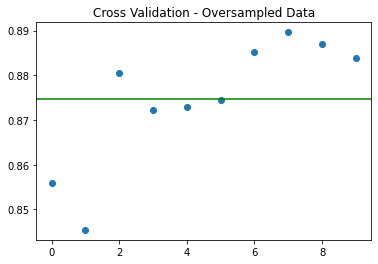

In [83]:
# Cross Validation score for normal data
knnscores = cross_val_score(estimator=knn,
                        X=X_Train,
                        y=Y_Train,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')

print('Cross validation - Normal Data scores: {}'.format(knnscores))
plt.title('Cross Validation - Normal Data')
plt.scatter(np.arange(len(knnscores)), knnscores)
plt.axhline(y=np.mean(knnscores), color='g') # Mean value of cross validation scores
plt.show()

# Cross Validation score for oversampled data
knnscores2 = cross_val_score(estimator=knn2,
                        X=X_Trainres,
                        y=Y_Trainres,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')
print('Cross Validation - Oversampled Data scores: {}'.format(knnscores2))
plt.title('Cross Validation - Oversampled Data')
plt.scatter(np.arange(len(knnscores2)), knnscores2)
plt.axhline(y=np.mean(knnscores2), color='g') # Mean value of cross validation scores
plt.show()

In [81]:
# permutation importance for normal data
knnperm = PermutationImportance(knn, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(knnperm, feature_names = list(x_test.columns))

Weight,Feature
0.0199 ± 0.0214,MORTDUE
0.0074 ± 0.0197,VALUE
0.0020 ± 0.0040,CLAGE
0 ± 0.0000,JOB_Self
0 ± 0.0000,JOB_Sales
0 ± 0.0000,JOB_ProfExe
0 ± 0.0000,JOB_Other
0 ± 0.0000,JOB_Office
0 ± 0.0000,REASON_HomeImp
0 ± 0.0000,NINQ


In [82]:
# permutation importance for oversampled data
knnperm2 = PermutationImportance(knn2, scoring = 'roc_auc', random_state= 101).fit(x_test, y_test)
show_weights(knnperm2, feature_names = list(x_test.columns))

Weight,Feature
0.0199 ± 0.0214,MORTDUE
0.0074 ± 0.0197,VALUE
0.0020 ± 0.0040,CLAGE
0 ± 0.0000,JOB_Self
0 ± 0.0000,JOB_Sales
0 ± 0.0000,JOB_ProfExe
0 ± 0.0000,JOB_Other
0 ± 0.0000,JOB_Office
0 ± 0.0000,REASON_HomeImp
0 ± 0.0000,NINQ


- From the permutation feature importance, we can see the green features that contribute the most to the drop of the overall model scores if the the feature's values are randomly shuffled. Those top features that are consistent in the darkest of green shades (in the normal & oversampled data) is only the MORTDUE feature. Special notice for VALUE & CLAGE that came amongst the top in the oversampled data. In other words, all of these features are important for our model in predicting BAD categories.

## 4.9 [LOGISTIC REGRESSION REPORTS]

In [80]:
from sklearn.linear_model import LogisticRegression

# fit the model with normal data
logreg = LogisticRegression()
logreg.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [81]:
# fit the model with oversampled data
logreg2 = LogisticRegression()
logreg2.fit(x_trainres, y_trainres)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [82]:
# classification report for normal data

from sklearn.metrics import classification_report
logreg_pred = logreg.predict(x_test)
logreg_predprob = logreg.predict_proba(x_test)
print(classification_report(y_test, logreg_pred))

# classification report for oversampled data

logreg_pred2 = logreg2.predict(x_test)
logreg_predprob2 = logreg2.predict_proba(x_test)
print(classification_report(y_test, logreg_pred2))

              precision    recall  f1-score   support

           0       0.79      1.00      0.88       694
           1       0.00      0.00      0.00       186

    accuracy                           0.79       880
   macro avg       0.39      0.50      0.44       880
weighted avg       0.62      0.79      0.70       880

              precision    recall  f1-score   support

           0       0.87      0.73      0.80       694
           1       0.37      0.59      0.46       186

    accuracy                           0.70       880
   macro avg       0.62      0.66      0.63       880
weighted avg       0.76      0.70      0.72       880



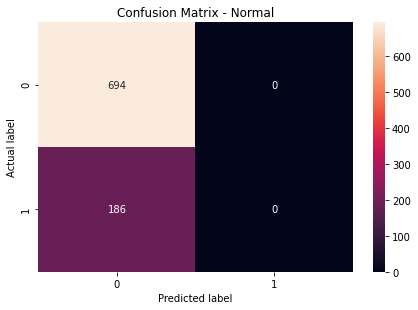

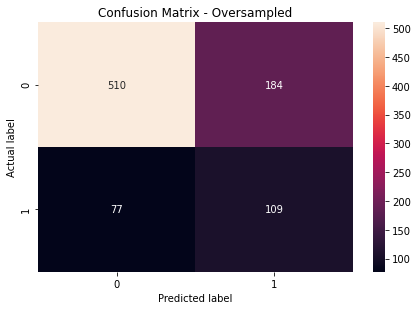

In [83]:
# confusion matrix for normal data

cnf_matrix = confusion_matrix(y_test, logreg_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Normal')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

# confusion matrix for oversampled data

cnf_matrix = confusion_matrix(y_test, logreg_pred2)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


In [84]:
from sklearn import metrics

print('Matthews Correlation Coefficient - Normal Data: {}'.format(metrics.matthews_corrcoef(y_test, logreg_pred)))
print('Matthews Correlation Coefficient - Oversampled Data: {}'.format(metrics.matthews_corrcoef(y_test, logreg_pred2)))
print('Log Loss - Normal Data: {}'.format(metrics.log_loss(y_test, logreg_predprob)))
print('Log Loss - Oversampled Data: {}'.format(metrics.log_loss(y_test, logreg_predprob2)))

Matthews Correlation Coefficient - Normal Data: 0.0
Matthews Correlation Coefficient - Oversampled Data: 0.27799820784958984
Log Loss - Normal Data: 0.4883063380359104
Log Loss - Oversampled Data: 0.5763306825304139


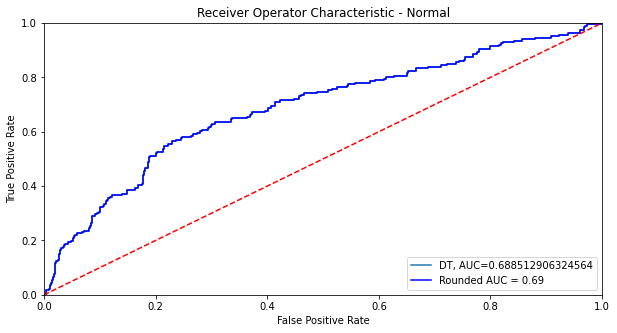

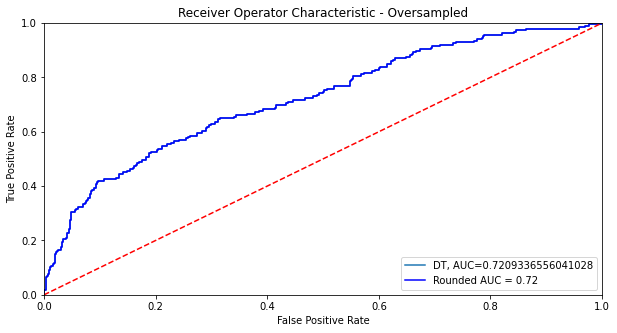

In [92]:
# ROC - AUC Score for normal data
logreg_pred_proba = logreg.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  logreg_pred_proba)
auc = metrics.roc_auc_score(y_test, logreg_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Normal')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# ROC - AUC Score for oversampled data
logreg_pred_proba2 = logreg2.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  logreg_pred_proba2)
auc = metrics.roc_auc_score(y_test, logreg_pred_proba2)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Oversampled')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

In [85]:
import statsmodels.api as sm

# model summary for normal data
logit_model = sm.Logit(y_train, sm.add_constant(x_train))
result = logit_model.fit(method = 'lbfgs')
print('##### Model Summary - Normal Data: #####')
print('\n')
print(result.summary2())
print('\n')

# model summary for oversampled data
logit_model2 = sm.Logit(y_trainres, sm.add_constant(x_trainres))
result2 = logit_model.fit(method = 'lbfgs')
print('##### Model Summary - Oversampled Data: #####')
print('\n')
print(result2.summary2())

##### Model Summary - Normal Data: #####


                         Results: Logit
Model:              Logit            Pseudo R-squared: -0.421   
Dependent Variable: BAD              AIC:              4908.3699
Date:               2020-03-30 13:05 BIC:              5000.8588
No. Observations:   3519             Log-Likelihood:   -2439.2  
Df Model:           14               LL-Null:          -1715.9  
Df Residuals:       3504             LLR p-value:      1.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     1.0000                                      
-----------------------------------------------------------------
                Coef.   Std.Err.    z     P>|z|    [0.025  0.975]
-----------------------------------------------------------------
const           0.0000    0.1558  0.0000  1.0000  -0.3054  0.3054
LOAN            0.0000    0.0000  0.0000  1.0000  -0.0000  0.0000
MORTDUE         0.0000    0.0000  0.0000  1.0000  -0.0000  0.0000
V

- It seems that our logreg model is not yet able to read our data well, it is still random guessing. Perhaps, we need to have some data transformation

In [86]:
from sklearn.preprocessing import FunctionTransformer
transformer = FunctionTransformer(np.log1p, validate = True)

X_train = x_train.copy()
X_trainres = x_trainres.copy()

# transforming features in normal data with log1p
for i in x_train.columns:
    X_train[i] = transformer.fit_transform(np.array(X_train[i]).reshape(1,-1))[0]
    
# transforming features in oversampled data with log1p    
for j in x_trainres.columns:
    X_trainres[j] = transformer.fit_transform(np.array(X_trainres[j]).reshape(1,-1))[0]


In [87]:
X_train.head()

,LOAN,MORTDUE,VALUE,YOJ,DELINQ,CLAGE,NINQ,CLNO,REASON_HomeImp,JOB_Office,JOB_Other,JOB_ProfExe,JOB_Sales,JOB_Self
257,8.779711,11.226762,11.660492,3.401197,0.0,5.810342,1.098612,3.663562,0.693359,0.693359,0.0,0.000000,0.0,0.0
1222,9.392745,10.957312,11.142977,2.397895,0.0,4.433812,0.693147,2.995732,0.000000,0.000000,0.0,0.000000,0.0,0.0
742,9.190240,10.907148,11.036662,2.397895,0.0,4.828487,0.000000,2.995732,0.000000,0.000000,0.0,0.000000,0.0,0.0
1317,9.409273,11.409286,11.612590,2.302585,0.0,5.287895,1.098612,3.637586,0.000000,0.000000,0.0,0.693359,0.0,0.0
24,7.972811,11.555736,11.701088,1.098612,0.0,4.630256,0.000000,2.639057,0.693359,0.693359,0.0,0.000000,0.0,0.0


In [88]:
# fit the model with normal transformed data 
logregt = LogisticRegression()
logregt.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [89]:
# fit the model with oversampled data
logregt2 = LogisticRegression()
logregt2.fit(X_trainres, y_trainres)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [90]:
# classification report for normal transformed data

logregt_pred = logregt.predict(x_test)
logregt_predprob = logregt.predict_proba(x_test)
print(classification_report(y_test, logregt_pred))

# classification report for oversampled transformed data

logregt_pred2 = logregt2.predict(x_test)
logregt_predprob2 = logregt2.predict_proba(x_test)
print(classification_report(y_test, logregt_pred2))

              precision    recall  f1-score   support

           0       0.67      0.00      0.01       694
           1       0.21      0.99      0.35       186

    accuracy                           0.21       880
   macro avg       0.44      0.50      0.18       880
weighted avg       0.57      0.21      0.08       880

              precision    recall  f1-score   support

           0       1.00      0.00      0.01       694
           1       0.21      1.00      0.35       186

    accuracy                           0.21       880
   macro avg       0.61      0.50      0.18       880
weighted avg       0.83      0.21      0.08       880



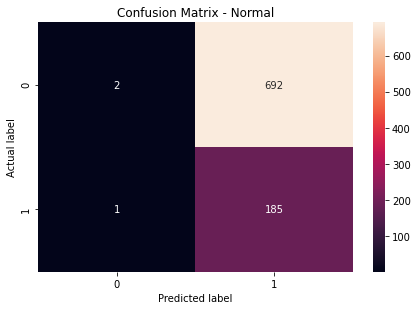

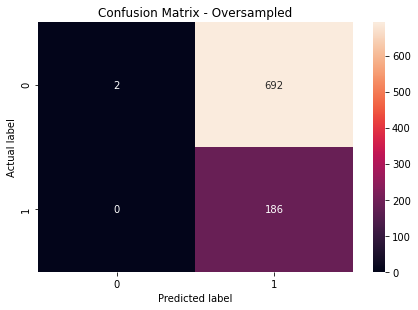

In [91]:
# confusion matrix for normal transformed data

cnf_matrix = confusion_matrix(y_test, logregt_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Normal')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

# confusion matrix for oversampled transformed data

cnf_matrix = confusion_matrix(y_test, logregt_pred2)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


In [92]:
print('Matthews Correlation Coefficient - Normal Transformed Data: {}'.format(metrics.matthews_corrcoef(y_test, logregt_pred)))
print('Matthews Correlation Coefficient - Oversampled Transformed Data: {}'.format(metrics.matthews_corrcoef(y_test, logregt_pred2)))
print('Log Loss - Normal Transformed Data: {}'.format(metrics.log_loss(y_test, logregt_predprob)))
print('Log Loss - Oversampled Transformed Data: {}'.format(metrics.log_loss(y_test, logregt_predprob2)))

Matthews Correlation Coefficient - Normal Transformed Data: -0.01747266861965099
Matthews Correlation Coefficient - Oversampled Transformed Data: 0.024708391654902004
Log Loss - Normal Transformed Data: 27.172368178219056
Log Loss - Oversampled Transformed Data: 27.16003780145249


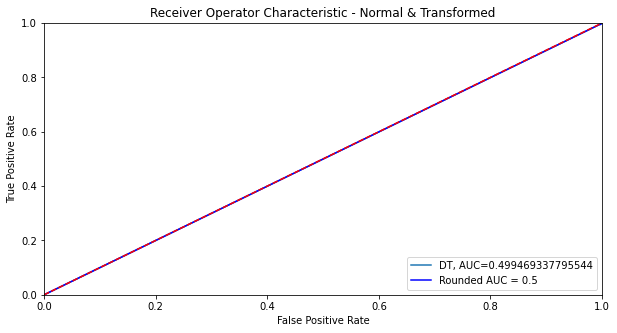

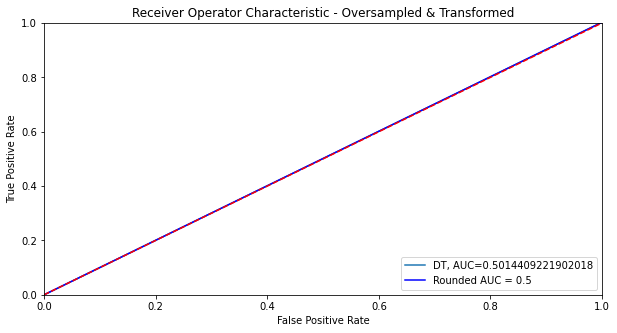

In [100]:
# ROC - AUC Score for normal transformed data
logregt_pred_proba = logregt.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  logregt_pred_proba)
auc = metrics.roc_auc_score(y_test, logregt_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Normal & Transformed')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# ROC - AUC Score for oversampled transformed data
logregt_pred_proba2 = logregt2.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  logregt_pred_proba2)
auc = metrics.roc_auc_score(y_test, logregt_pred_proba2)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - Oversampled & Transformed')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Cross validation - Normal Data scores: [0.79366326 0.77140613 0.75988479 0.71715109 0.77700969 0.76046085
 0.7749149  0.7693662  0.79743165 0.7467942 ]


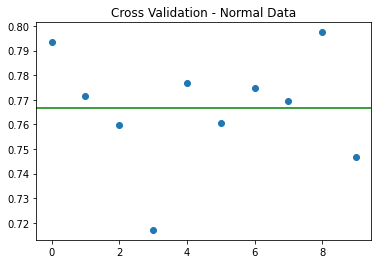

Cross Validation - Oversampled Data scores: [0.73270545 0.75937211 0.83016313 0.90891967 0.88385224 0.89172226
 0.91351618 0.90775883 0.90880899 0.90673338]


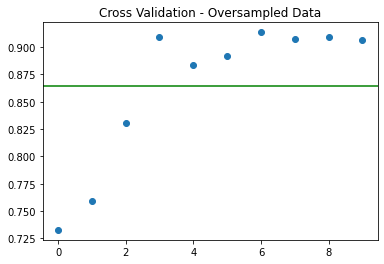

In [96]:
from sklearn.model_selection import cross_val_score

# Cross Validation score for normal data
logregtscores = cross_val_score(estimator=logregt,
                        X=X_train,
                        y=y_train,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')

print('Cross validation - Normal Data scores: {}'.format(logregtscores))
plt.title('Cross Validation - Normal Data')
plt.scatter(np.arange(len(logregtscores)), logregtscores)
plt.axhline(y=np.mean(logregtscores), color='g') # Mean value of cross validation scores
plt.show()

# Cross Validation score for oversampled data
logregtscores2 = cross_val_score(estimator=logregt2,
                        X=X_trainres,
                        y=y_trainres,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')
print('Cross Validation - Oversampled Data scores: {}'.format(logregtscores2))
plt.title('Cross Validation - Oversampled Data')
plt.scatter(np.arange(len(logregtscores2)), logregtscores2)
plt.axhline(y=np.mean(logregtscores2), color='g') # Mean value of cross validation scores
plt.show()

In [93]:
# model summary for normal transformed data
logit_model_t = sm.Logit(y_train, sm.add_constant(X_train))
result_t = logit_model_t.fit(method = 'lbfgs')
print('##### Model Summary - Normal Data: #####')
print('\n')
print(result_t.summary2())
print('\n')

# model summary for oversampled transformed data
logit_mode_t2 = sm.Logit(y_trainres, sm.add_constant(X_trainres))
result_t2 = logit_mode_t2.fit(method = 'lbfgs')
print('##### Model Summary - Oversampled Data: #####')
print('\n')
print(result_t2.summary2())

##### Model Summary - Normal Data: #####


                          Results: Logit
Model:              Logit            Pseudo R-squared: 0.171      
Dependent Variable: BAD              AIC:              2873.4006  
Date:               2020-03-30 13:06 BIC:              2965.8896  
No. Observations:   3519             Log-Likelihood:   -1421.7    
Df Model:           14               LL-Null:          -1715.9    
Df Residuals:       3504             LLR p-value:      1.5280e-116
Converged:          0.0000           Scale:            1.0000     
No. Iterations:     35.0000                                       
------------------------------------------------------------------
                    Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
------------------------------------------------------------------
const               0.2400   1.3612  0.1763 0.8600 -2.4279  2.9079
LOAN               -0.2411   0.0981 -2.4569 0.0140 -0.4334 -0.0488
MORTDUE            -0.2140   0.1221 -1.7527 0

- From the model summary, we can see the features that has influence on our target variable (BAD) by looking at their p-values. If the p-value < 0.05, it means that the feature have influence over BAD. For better interpretability & relevance, I choose to interpret only the normal & transformed data. And from the observations, we can see that the features that has influence over the BAD categories are:
        - DELINQ 
        - CLAGE 
        - NINQ
        - LOAN
        - VALUE
        - JOB_Office 
        - REASON_HomeImp
- It is interesting to note that DELINQ feature has the biggest coefficient value amongst the features with the value of 1.6046. This finding could show that in overall DELINQ has a bigger influence towards BAD in relative to other features.
    

## 5. [OVERALL MODEL PERFORMANCE]

In [103]:
# Finding the highest accuracy & recall score (trying to minimize False Negative)
list1 = [dtree_pred, dtree_pred2, rfc_pred, rfc_pred2, xgb_pred, xgb_pred2, knn_pred, knn_pred2, nb_pred, nb_pred2, logreg_pred, logreg_pred2,
        logregt_pred, logregt_pred2,]

list3 = ['DT  :', 'DT2 :', 'RF  :', 'RF2 :', 'XGB :', 'XGB2:', 'KNN :', 'KNN2:', 'NB  :', 'NB2 :',
        'LR  :', 'LR2 :', 'LRT :', 'LRT2:' ]

for i,j in list(zip(list1,list3)):
    print('Accuracy Score in',j,metrics.accuracy_score(y_test, i))
    print('  Recall Score in',j,metrics.recall_score(y_test, i)) 

Accuracy Score in DT  : 0.8727272727272727
  Recall Score in DT  : 0.6021505376344086
Accuracy Score in DT2 : 0.8738636363636364
  Recall Score in DT2 : 0.6290322580645161
Accuracy Score in RF  : 0.9170454545454545
  Recall Score in RF  : 0.6129032258064516
Accuracy Score in RF2 : 0.9409090909090909
  Recall Score in RF2 : 0.7473118279569892
Accuracy Score in XGB : 0.9261363636363636
  Recall Score in XGB : 0.6881720430107527
Accuracy Score in XGB2: 0.9340909090909091
  Recall Score in XGB2: 0.7365591397849462
Accuracy Score in KNN : 0.9045454545454545
  Recall Score in KNN : 0.5483870967741935
Accuracy Score in KNN2: 0.9647727272727272
  Recall Score in KNN2: 0.8440860215053764
Accuracy Score in NB  : 0.7931818181818182
  Recall Score in NB  : 0.15591397849462366
Accuracy Score in NB2 : 0.7420454545454546
  Recall Score in NB2 : 0.43548387096774194
Accuracy Score in LR  : 0.7886363636363637
  Recall Score in LR  : 0.0
Accuracy Score in LR2 : 0.7034090909090909
  Recall Score in LR2 : 

The highest overall Accuracy & Recall score is achieved by KNN2 (K-NearestNeighboursClassifier - Oversampled) with an Accuracy Score of 0.9647727272727272 & Recall Score of 0.8440860215053764. 
    - It means that the model predicted 97% of data rightly & recalled 84% of all the Actual Positives  
The second highest overall Accuracy & Recall score is achieved by RF2 (RandomForestClassifier - Oversampled) with an Accuracy Score of 0.9409090909090909 & Recall Score of 0.7473118279569892. 
    - It means that the model predicted 94% of data rightly & recalled 75% of all the Actual Positives  

In [104]:
# Finding the highest ROC-AUC score 
list2 = [dtree_pred_proba, dtree_pred_proba2, rfc_pred_proba, rfc_pred_proba2, xgb_pred_proba, xgb_pred_proba2, knn_pred_proba, knn_pred_proba2, nb_pred_proba, nb_pred_proba2, logreg_pred_proba, logreg_pred_proba2,
        logregt_pred_proba, logregt_pred_proba2,]

list3 = ['DT  :', 'DT2 :', 'RF  :', 'RF2 :', 'XGB :', 'XGB2:', 'KNN :', 'KNN2:', 'NB  :', 'NB2 :',
        'LR  :', 'LR2 :', 'LRT :', 'LRT2:' ]

for i,j in list(zip(list2,list3)):
    print('ROC-AUC Score in',j,metrics.roc_auc_score(y_test, i)) 

ROC-AUC Score in DT  : 0.7736977472033715
ROC-AUC Score in DT2 : 0.7842567630380217
ROC-AUC Score in RF  : 0.9901808124941899
ROC-AUC Score in RF2 : 0.9875546155991448
ROC-AUC Score in XGB : 0.9576167456849805
ROC-AUC Score in XGB2: 0.9608859347401693
ROC-AUC Score in KNN : 0.7936421245080724
ROC-AUC Score in KNN2: 0.7936421245080724
ROC-AUC Score in NB  : 0.7102042081125468
ROC-AUC Score in NB2 : 0.6817576151963063
ROC-AUC Score in LR  : 0.688512906324564
ROC-AUC Score in LR2 : 0.7209336556041028
ROC-AUC Score in LRT : 0.499469337795544
ROC-AUC Score in LRT2: 0.5014409221902018


- The highest ROC-AUC score is achieved by RF (RandomForestClassifier - Normal) with an ROC-AUC score of 0.9901808124941899 
- The second highest ROC-AUC score is achieved by RF2 (RandomForestClassifier - Oversampled) with an ROC-AUC score of 0.9875546155991448


In [105]:
# Finding the highest average of Cross-Validation scores (cv=10)
list1 = [dtreescores, dtreescores2, rfcscores, rfcscores2, xgbscores, xgbscores2, knnscores, knnscores2, nbscores, nbscores2, logregtscores, logregtscores2]

list3 = ['DT  :', 'DT2 :', 'RF  :', 'RF2 :', 'XGB :', 'XGB2:', 'KNN :', 'KNN2:', 'NB  :', 'NB2 :',
        'LRT :', 'LRT2:']

for i,j in list(zip(list1,list3)):
    print('Average Cross-Validation score in',j,sum(i)/len(i))

Average Cross-Validation score in DT  : 0.7996620346356127
Average Cross-Validation score in DT2 : 0.9123931307141092
Average Cross-Validation score in RF  : 0.9790191048095327
Average Cross-Validation score in RF2 : 0.9958538683625295
Average Cross-Validation score in XGB : 0.948595468076701
Average Cross-Validation score in XGB2: 0.9920089258233302
Average Cross-Validation score in KNN : 0.7898774165408946
Average Cross-Validation score in KNN2: 0.8747202757945022
Average Cross-Validation score in NB  : 0.7104196013457329
Average Cross-Validation score in NB2 : 0.8501399152068458
Average Cross-Validation score in LRT : 0.7668082748295761
Average Cross-Validation score in LRT2: 0.864355225226397


- The highest Average Cross-Validation score is achieved by RF2 (RandomForestClassifier - Oversampled) with an average score of 0.9958538683625295
- The second highest Average Cross-Validation score is achieved by XGB2 (XGBoostingClassifier - Oversampled) with an average score of 0.9920089258233302


## 6. [HYPERPARAMETER TUNING]

- From the previous model evaluations, we may see that RandomForestClassifier (Oversampled) is, in overall, the most consistent in predicting our home equity loan default dataset. From here on, we will conduct hyperparameter tuning using RandomForestClassifier (Oversampled) model.

In [106]:
## RANDOMIZEDSEARCHCV
from sklearn.model_selection import RandomizedSearchCV

# number of tress in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# number of features to consider at every split
max_features = ['auto','sqrt']

# maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# minimum number of samples required to split a node
min_samples_split = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 100)]

# minimum number of samples required at each leaf node
min_samples_leaf = [int(x) for x in np.linspace(1, 11, num = 10)]

# method of selecting samples for training each tree
bootstrap = [True, False]

# create the random grid
random_grid = {'n_estimators': n_estimators,
                'max_features': max_features,
                'max_depth': max_depth,
                'min_samples_split': min_samples_split,
                'min_samples_leaf': min_samples_leaf,
                'bootstrap': bootstrap}
                    

In [107]:
# making three sets of RandomizedSearch
rf_random = RandomizedSearchCV(estimator = rfc,
                    param_distributions = random_grid,
                    cv = 3, n_jobs = -1, n_iter = 10)
rf_random2 = RandomizedSearchCV(estimator = rfc,
                    param_distributions = random_grid,
                    cv = 3, n_jobs = -1, n_iter = 10)
rf_random3 = RandomizedSearchCV(estimator = rfc,
                    param_distributions = random_grid,
                    cv = 3, n_jobs = -1, n_iter = 10)

In [108]:
# first set
rf_random.fit(x_trainres, y_trainres)

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [109]:
# first set's best params
rf_random.best_params_

{'n_estimators': 400,
 'min_samples_split': 218,
 'min_samples_leaf': 6,
 'max_features': 'auto',
 'max_depth': 100,
 'bootstrap': False}

In [110]:
# second set
rf_random2.fit(x_trainres, y_trainres)

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [111]:
# second set's best param
rf_random2.best_params_

{'n_estimators': 1200,
 'min_samples_split': 154,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 110,
 'bootstrap': False}

In [112]:
# third set
rf_random3.fit(x_trainres, y_trainres)

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [113]:
# third set's best param
rf_random3.best_params_

{'n_estimators': 1000,
 'min_samples_split': 127,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 70,
 'bootstrap': False}

- rfc2 parameters:
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=190,
                       verbose=0, warm_start=False)

In [114]:
## GRIDSEARCHCV
from sklearn.model_selection import GridSearchCV

# using estimator of rfc2, our best & most consistent model
# the hyperparameter input here is fitted in accordance with best hyperparameters that we have found in the previous model as well as its randomized searches
# since we are focusing on its ability to avoid False Negatives, we use recall as its gridsearchcv scoring
grid = GridSearchCV(estimator = rfc2,
                    refit = 'recall',
                    param_grid = {
                        'n_estimators':[1000,1800],
                        'bootstrap': [True,False],
                        'max_features': ['sqrt','auto'],
                        'max_depth': [80,None],
                        }, 
                    scoring = 'recall',
                    cv = 5, n_jobs = -1)

In [115]:
grid.fit(x_trainres, y_trainres)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=1000, n_jobs=None,
                                              oob_score=False, random_state=190,
                                

In [116]:
# best score
grid.best_score_

0.9304116177966885

In [117]:
# best parameters
grid.best_params_

{'bootstrap': False,
 'max_depth': 80,
 'max_features': 'sqrt',
 'n_estimators': 1800}

In [7]:
# creating & fitting a new RFC model with the best parameters from GridSearch
from sklearn.ensemble import RandomForestClassifier
tuned = RandomForestClassifier(bootstrap= False, max_depth = 80, max_features = 'sqrt', n_estimators = 1800, random_state = 1)
tuned.fit(x_trainres, y_trainres)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=80, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1800,
                       n_jobs=None, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)

In [99]:
print("-------------BEFORE HYPERPARAMETER TUNING-------------")
print(classification_report(y_test,rfc_pred2))
tuned_pred = tuned.predict(x_test)
tuned_predprob = tuned.predict_proba(x_test)
print("\n")
print("--------------AFTER HYPERPARAMETER TUNING-------------")
print(classification_report(y_test,tuned_pred))

-------------BEFORE HYPERPARAMETER TUNING-------------
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       694
           1       0.97      0.75      0.84       186

    accuracy                           0.94       880
   macro avg       0.95      0.87      0.90       880
weighted avg       0.94      0.94      0.94       880



--------------AFTER HYPERPARAMETER TUNING-------------
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       694
           1       0.97      0.80      0.88       186

    accuracy                           0.95       880
   macro avg       0.96      0.89      0.92       880
weighted avg       0.95      0.95      0.95       880



In [120]:
print("-------------BEFORE HYPERPARAMETER TUNING-------------")
print('Accuracy Score',metrics.accuracy_score(y_test, rfc_pred2))
print('  Recall Score',metrics.recall_score(y_test, rfc_pred2))
print('      F1 Score',metrics.f1_score(y_test, rfc_pred2))
print("\n")
print("-------------AFTER HYPERPARAMETER TUNING---------------")
print('Accuracy Score',metrics.accuracy_score(y_test, tuned_pred))
print('  Recall Score',metrics.recall_score(y_test, tuned_pred))
print('      F1 Score',metrics.f1_score(y_test, tuned_pred))

-------------BEFORE HYPERPARAMETER TUNING-------------
Accuracy Score 0.9409090909090909
  Recall Score 0.7473118279569892
      F1 Score 0.8424242424242423


-------------AFTER HYPERPARAMETER TUNING---------------
Accuracy Score 0.9522727272727273
  Recall Score 0.7956989247311828
      F1 Score 0.8757396449704142


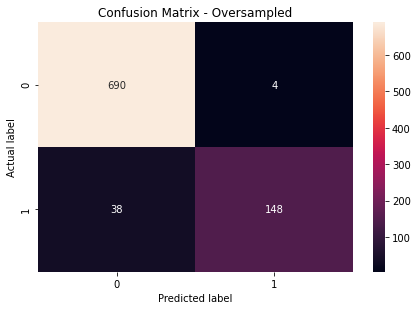

In [100]:
# confusion matrix for after hyperparameter tuning

cnf_matrix = confusion_matrix(y_test, tuned_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

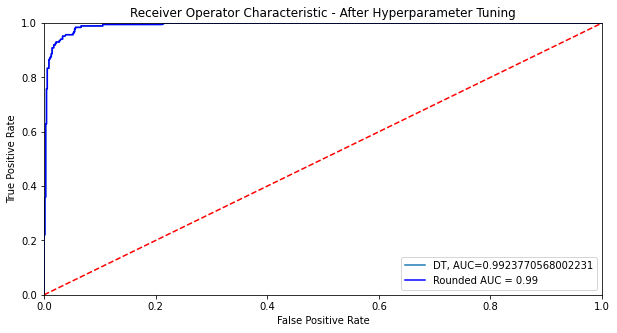

In [135]:
# ROC - AUC Score for after hyperparameter tuning
tuned_pred_proba = tuned.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  tuned_pred_proba)
auc = metrics.roc_auc_score(y_test, tuned_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - After Hyperparameter Tuning')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()


Cross Validation - Oversampled Data scores: [0.99186211 0.98744845 0.99777162 0.99949523 0.99944403 0.99873981
 0.99964171 0.99987645 0.9997529  0.99927106]


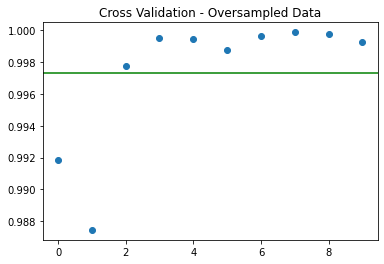

Average value of cross validation scores:  0.9973303378287577


In [122]:
# Cross Validation score for tuned & oversampled data
tunedscores = cross_val_score(estimator=tuned,
                        X=x_trainres,
                        y=y_trainres,
                        cv=10,
                        n_jobs=1,
                        scoring = 'roc_auc')
print('Cross Validation - Oversampled Data scores: {}'.format(tunedscores))
plt.title('Cross Validation - Oversampled Data')
plt.scatter(np.arange(len(tunedscores)), tunedscores)
plt.axhline(y=np.mean(tunedscores), color='g') # Mean value of cross validation scores
plt.show()
print('Average value of cross validation scores: ',np.mean(tunedscores))

- it can be seen that our overall model has improved, especially its recall scoring (for the positive value) from 0.75 to 0.80 
- with an increase in recall scoring, the F1 score also improved from 0.84 to 0.88 and the overall accuracy increased 1% to 0.95
- it also increase the ROC-AUC score from 0.9901 to 0.9923
- hyperparameter tuning does increase the overall performance of the RandomForestClassifier (Oversampled) model

## 7. [LEARNING CURVE]

train mean: 
[1. 1. 1. 1. 1.]
test mean: 
[0.65444347 0.75173587 0.78538414 0.80880979 0.81836457]


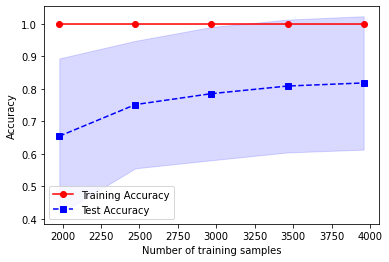

In [140]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=tuned,
                                                       X=x,
                                                       y=y,
                                                       train_sizes=np.linspace(0.5, 1.0, 5),
                                                       cv=10)
# Mean value of accuracy against training data
train_mean = np.mean(train_scores, axis=1)
                                                        
print('train mean: ')
print(train_mean)
                                                        
# Standard deviation of training accuracy per number of training samples
train_std = np.std(train_scores, axis=1)


# Same as above for test data
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

print('test mean: ')
print(test_mean)


# Plot training accuracies 
plt.plot(train_sizes, train_mean, color='red', marker='o', label='Training Accuracy')
# Plot the variance of training accuracies
plt.fill_between(train_sizes,
                train_mean + train_std,
                train_mean - train_std,
                alpha=0.15, color='red')

# Plot for test data as training data
plt.plot(train_sizes, test_mean, color='blue', linestyle='--', marker='s', 
        label='Test Accuracy')
plt.fill_between(train_sizes,
                test_mean + test_std,
                test_mean - test_std,
                alpha=0.15, color='blue')

plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

- From the learning curve, we may see that our tuned model gains more test accuracy as we increase the number of training samples (with the condition that our training accuracy is stable). This curve means that our tuned model may learn & perform better with bigger dataset. Perhaps, we could give it more datasets in the future so that it could gain better accuracy. 

## 8. [AUTO ML REPORTS]

In [12]:
# let's benchmark our tuned model performance with AutoML
from tpot import TPOTClassifier
tpot = TPOTClassifier(subsample = 0.8, verbosity = 2, warm_start=True, early_stop=20, max_time_mins= 60, n_jobs= -2)

In [41]:
# fitting TPOT to our data
tpot.fit(x_train, y_train)

Generation 1 - Current best internal CV score: 0.9005328596802842
Generation 2 - Current best internal CV score: 0.9069271758436944
Generation 3 - Current best internal CV score: 0.9193605683836589
Generation 4 - Current best internal CV score: 0.9193605683836589
Generation 5 - Current best internal CV score: 0.9193605683836589
Generation 6 - Current best internal CV score: 0.9193605683836589
Generation 7 - Current best internal CV score: 0.9349911190053287
Generation 8 - Current best internal CV score: 0.9349911190053287
Generation 9 - Current best internal CV score: 0.9349911190053287

60.82 minutes have elapsed. TPOT will close down.
TPOT closed during evaluation in one generation.


TPOT closed prematurely. Will use the current best pipeline.

Best pipeline: DecisionTreeClassifier(BernoulliNB(MinMaxScaler(ExtraTreesClassifier(PolynomialFeatures(input_matrix, degree=2, include_bias=False, interaction_only=False), bootstrap=False, criterion=gini, max_features=0.55, min_samples_leaf=2

TPOTClassifier(config_dict=None, crossover_rate=0.1, cv=5,
               disable_update_check=False, early_stop=20, generations=100,
               max_eval_time_mins=5, max_time_mins=60, memory=None,
               mutation_rate=0.9, n_jobs=-2, offspring_size=None,
               periodic_checkpoint_folder=None, population_size=100,
               random_state=None, scoring=None, subsample=0.8, template=None,
               use_dask=False, verbosity=2, warm_start=True)

In [62]:
# exporting our model results
tpot.export('tpot_LOAN_DEFAULT.py')

In [63]:
# using our AutoML model ('tpot_LOAN_DEFAULT.py') to normal & oversampled data
import numpy as np
import pandas as pd
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.pipeline import make_pipeline, make_union
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
from sklearn.tree import DecisionTreeClassifier
from tpot.builtins import StackingEstimator

# Average CV score on the training set was: 0.9353463587921848
# fitting the AutoML for the normal data
exported_pipeline = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False, interaction_only=False),
    StackingEstimator(estimator=ExtraTreesClassifier(bootstrap=False, criterion="gini", max_features=0.55, min_samples_leaf=2, min_samples_split=5, n_estimators=100)),
    MinMaxScaler(),
    StackingEstimator(estimator=BernoulliNB(alpha=0.001, fit_prior=True)),
    DecisionTreeClassifier(criterion="entropy", max_depth=5, min_samples_leaf=12, min_samples_split=9))

exported_pipeline.fit(x_train, y_train)
automl = exported_pipeline.predict(x_test)

# fitting the AutoML for the oversampled data
exported_pipeline2 = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False, interaction_only=False),
    StackingEstimator(estimator=ExtraTreesClassifier(bootstrap=False, criterion="gini", max_features=0.55, min_samples_leaf=2, min_samples_split=5, n_estimators=100)),
    MinMaxScaler(),
    StackingEstimator(estimator=BernoulliNB(alpha=0.001, fit_prior=True)),
    DecisionTreeClassifier(criterion="entropy", max_depth=5, min_samples_leaf=12, min_samples_split=9))

exported_pipeline2.fit(x_trainres, y_trainres)
automl2 = exported_pipeline2.predict(x_test)

In [64]:
# classification report for autoML & normal data

from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(y_test, automl))

# classification report for autoML & oversampled data

print(classification_report(y_test, automl2))

              precision    recall  f1-score   support

           0       0.92      1.00      0.95       694
           1       0.98      0.66      0.78       186

    accuracy                           0.92       880
   macro avg       0.95      0.83      0.87       880
weighted avg       0.93      0.92      0.92       880

              precision    recall  f1-score   support

           0       0.93      1.00      0.96       694
           1       0.98      0.74      0.84       186

    accuracy                           0.94       880
   macro avg       0.96      0.87      0.90       880
weighted avg       0.94      0.94      0.94       880



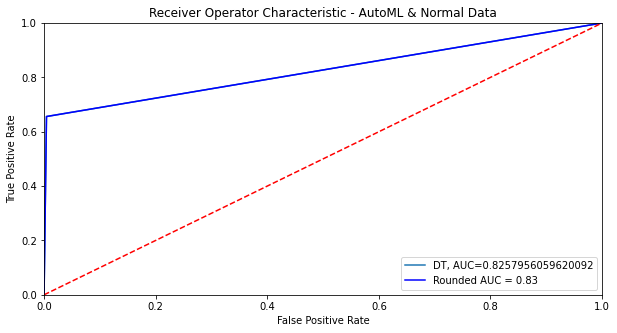

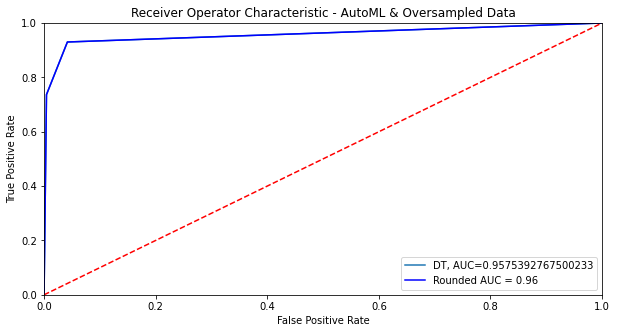

In [65]:
from sklearn import metrics

# ROC - AUC Score for autoML in normal data
automl_pred_proba = exported_pipeline.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  automl_pred_proba)
auc = metrics.roc_auc_score(y_test, automl_pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - AutoML & Normal Data')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

# ROC - AUC Score for autoML in oversampled data
automl_pred_proba2 = exported_pipeline2.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  automl_pred_proba2)
auc = metrics.roc_auc_score(y_test, automl_pred_proba2)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - AutoML & Oversampled Data')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

From the observations:
- If we compare the results that we get from autoML & our own tuned model (oversampled), we could see that the latter performs better. Our own model performs higher not only in accuracy & recall scores but also in ROC-AUC Scores.
- It is better for the analyzing counterpart to use the tuned model (oversampled) for better overall prediction

## 9. [MODEL DEPLOYMENT]

In [17]:
# fit our tuned model to the whole of original dataframe
tuned.fit(x,y)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=80, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1800,
                       n_jobs=None, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)

In [20]:
# prediction results
from sklearn.metrics import classification_report,confusion_matrix
all_pred = tuned.predict(x)
all_predprob = tuned.predict_proba(x)
print(classification_report(y, all_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3541
           1       1.00      1.00      1.00       858

    accuracy                           1.00      4399
   macro avg       1.00      1.00      1.00      4399
weighted avg       1.00      1.00      1.00      4399



In [21]:
# saving algorithm for further usage
import pickle
filename = 'hmeq_loan_default_tuned.sav';
pickle.dump(tuned, open(filename, 'wb'))

## 10. [CONCLUDING NOTES]

#### 1) On features:
Through all the tests & observations, there are three most frequent features that keeps showing up and they are DELINQ, CLAGE, and NINQ features with DELINQ as the most fundamental feature. These feature(s) could be the feature(s) that has better association towards our target variable (BAD) and may prove to be important for further tests & observations.

#### 2) On clusters:
There's a cluster of outliers that is consisted of 37 datapoints & has an alarming sign towards loan default. In relative to other customers, the bank needs further precaution for this type of customer.

#### 3) On predictions:
In overall, the best model for our prediction is RandomForestClassifier (Oversampled) that's hyperparameter-tuned. It even gives better results than the AutoML model, especially in its Recall since we're trying to minimize False Negatives in our predictions.

#### 4) On samples:
There's an indication that the model predictions could improve with larger datasets. It's recommended for further tests & observations to have bigger datasets.

## ---------------------------------------------------- THANK YOU --------------------------------------------------------------